In [1]:
import flylib as flb
#from thllib import flylib as flb
import flylib as flb
from matplotlib import pyplot as plt
import numpy as np
import scipy
from flylib import util
import figurefirst as fifi
import scipy.signal
#import local_project_functions as lpf
from IPython.display import SVG,display
import pandas as pd

/home/imager/.local/lib/python2.7/site-packages/pandas/core/computation/__init__.py:18: UserWarning: The installed version of numexpr 2.4.3 is not supported in pandas and will be not be used
The minimum supported version is 2.4.6

  ver=ver, min_ver=_MIN_NUMEXPR_VERSION), UserWarning)


In [2]:
import seaborn as sns

/usr/lib/python2.7/dist-packages/matplotlib/__init__.py:874: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [3]:
import networkx as nx

In [4]:
#fly_nums = range(1389,1402)#,1545)
#multi_fly_df = util.construct_multi_fly_df(fly_nums)

#fly_nums = range(1635, 1637) + range(1637, 1639) + range(1640, 1643) + range(1645, 1647) + range(1648, 1651) + range(1653, 1654) #+ range(1655, 1656) 
#multi_fly_df = util.construct_multi_fly_df(fly_nums)

fly_nums = range(1706, 1709) + range(1711, 1714) + range (1715, 1719) + range(1719, 1722) + range(1722, 1727)  ## last one are the newest trials -- 

multi_fly_df = util.construct_multi_fly_df(fly_nums)

Making dataframe for fly number 1706
Making dataframe for fly number 1707
Making dataframe for fly number 1708
Making dataframe for fly number 1711
Making dataframe for fly number 1712
Making dataframe for fly number 1713
Making dataframe for fly number 1715
Making dataframe for fly number 1716
Making dataframe for fly number 1717
Making dataframe for fly number 1718
Making dataframe for fly number 1719
Making dataframe for fly number 1720
Making dataframe for fly number 1721
Making dataframe for fly number 1722
Making dataframe for fly number 1723
Making dataframe for fly number 1724
Making dataframe for fly number 1725
Making dataframe for fly number 1726


In [77]:
#fly_nums = range(1658, 1662) 
#multi_fly_df = util.construct_multi_fly_df(fly_nums)

In [5]:
print(multi_fly_df.columns.values)
print(np.unique(multi_fly_df['stimulus']))

idx = (multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=-8, b_y=0, ch=True')& \
        ((multi_fly_df['amp_diff']>0.1)&(multi_fly_df['amp_diff']<0.104))


# double_filtered_df = multi_fly_df.loc[idx]
# print(double_filtered_df)

['t' 'stimulus' 'amp_diff' 'left_amp' 'right_amp' 'fly_num' 'wbf'
 'experimental_condition' 'pr_left' 'tpd_left' 'nm_left' 'iii1_left'
 'iii3_left' 'i2_left' 'hg2_left' 'hg3_left' 'hg1_left' 'i1_left'
 'bkg_left' 'b1_left' 'b2_left' 'b3_left' 'iii24_left' 'hg4_left'
 'pr_right' 'tpd_right' 'nm_right' 'iii1_right' 'iii3_right' 'i2_right'
 'hg2_right' 'hg3_right' 'hg1_right' 'i1_right' 'bkg_right' 'b1_right'
 'b2_right' 'b3_right' 'iii24_right' 'hg4_right']
['exc_cl_starfield, g_x = 1, g_y=0, b_x =0, b_y = 0, ch=0'
 'pitch_down_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'pitch_up_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'pretrial_stripe_fix'
 'roll_clockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'roll_counterclockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'trials_ended' 'yaw_left, g_x=12, g_y=0, b_x=0, b_y=0, ch=0'
 'yaw_right, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']


In [6]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


In [7]:
yaw_left = multi_fly_df.loc[multi_fly_df['stimulus']== 'yaw_left, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
yaw_right = multi_fly_df.loc[multi_fly_df['stimulus']== 'yaw_right, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
pitch_up = multi_fly_df.loc[multi_fly_df['stimulus']== 'pitch_up_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
pitch_down = multi_fly_df.loc[multi_fly_df['stimulus']== 'pitch_down_actually_roll, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
roll_cw = multi_fly_df.loc[multi_fly_df['stimulus']== 'roll_clockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']
roll_ccw = multi_fly_df.loc[multi_fly_df['stimulus']== 'roll_counterclockwise_actually_pitch, g_x=12, g_y=0, b_x=0, b_y=0, ch=0']




In [31]:
#yaw_left['experimental_condition']=='condition=test'

In [8]:
yaw_left_a = yaw_left.loc[yaw_left['experimental_condition']== 'condition=test']
yaw_right_a = yaw_right.loc[yaw_right['experimental_condition']== 'condition=test']
pitch_up_a = pitch_up.loc[pitch_up['experimental_condition']== 'condition=test']
pitch_down_a = pitch_down.loc[pitch_down['experimental_condition']== 'condition=test']
roll_cw_a = roll_cw.loc[roll_cw['experimental_condition']== 'condition=test']
roll_ccw_a = roll_ccw.loc[roll_ccw['experimental_condition']== 'condition=test']




In [9]:
#filtered_df= multi_fly_df.loc[multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=-8, b_y=0, ch=True']
#filtered_df= multi_fly_df
filtered_df_yaw_left= multi_fly_df.loc[multi_fly_df['stimulus']== 'ol_blocks, g_x=12, g_y=0 b_x=0, b_y=0'] #'cl_blocks, g_x=-1, g_y=-4 b_x=-8, b_y=0']
#filtered_df= multi_fly_df.loc(multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=0, b_y=0, ch=False')
#print(filtered_df.head())


In [10]:
filtered_df_turn_left = multi_fly_df.loc[multi_fly_df['amp_diff'] >= 0]

In [11]:
filtered_df_turn_right = multi_fly_df.loc[multi_fly_df['amp_diff'] <= 0]

In [12]:
mean_left_amp = np.mean(multi_fly_df.left_amp)

In [13]:
mean_right_amp = np.mean(multi_fly_df.right_amp)

In [ ]:
#  df1 = df[(df.a != -1) & (df.b != -1)]

In [14]:
type(mean_right_amp)
mean_right_amp_int = int(mean_right_amp)
mean_left_amp_int = int(mean_left_amp)

In [ ]:
##

In [17]:
WSA_increase = multi_fly_df.loc[(multi_fly_df['left_amp'] >= mean_left_amp*1.1) & (multi_fly_df['right_amp'] >= mean_right_amp*1.1)]

In [18]:
WSA_left_turn = multi_fly_df.loc[(multi_fly_df['left_amp'] >= mean_left_amp*1.12) & (multi_fly_df['right_amp'] <= mean_right_amp*.89)]

In [19]:
WSA_right_turn = multi_fly_df.loc[(multi_fly_df['left_amp'] <= mean_left_amp*.9) & (multi_fly_df['right_amp'] >= mean_right_amp*1.1)]

In [20]:
WSA_decrease = multi_fly_df.loc[(multi_fly_df['left_amp'] <= mean_left_amp*.9) & (multi_fly_df['right_amp'] <= mean_right_amp*.9)]

In [15]:
#WSA_decrease = multi_fly_df.loc[multi_fly_df['left_amp'] >= mean_left_amp & multi_fly_df['right_amp'] >= mean_right_amp]

In [36]:
WSA_increase.head()


,t,stimulus,amp_diff,left_amp,right_amp,fly_num,wbf,experimental_condition,pr_left,tpd_left,...,hg2_right,hg3_right,hg1_right,i1_right,bkg_right,b1_right,b2_right,b3_right,iii24_right,hg4_right
12,0.240004,pretrial_stripe_fix,-0.076556,1.133057,1.209613,1635,165.5,condition=pretrial_closed_loop;gain=-1,4.257909,1.564879,...,31.674398,0.282236,6.589476,2.809470,43.334064,3.512439,0.470378,4.460718,0.0,0.0
13,0.260004,pretrial_stripe_fix,-0.377313,1.165866,1.543179,1635,165.5,condition=pretrial_closed_loop;gain=-1,4.258265,1.593071,...,32.049574,0.293682,6.540529,2.810044,43.314761,3.542204,0.457125,4.407330,0.0,0.0
14,0.280005,pretrial_stripe_fix,-0.437464,1.083842,1.521306,1635,165.5,condition=pretrial_closed_loop;gain=-1,4.266575,1.529632,...,31.940785,0.326637,6.548165,2.805896,43.178962,3.498148,0.468206,4.512047,0.0,0.0
15,0.300005,pretrial_stripe_fix,0.065620,1.138525,1.072905,1635,165.5,condition=pretrial_closed_loop;gain=-1,4.286669,1.605054,...,31.968374,0.315640,6.550670,2.818469,43.370705,3.501761,0.445907,4.505959,0.0,0.0
17,0.340006,pretrial_stripe_fix,-0.087493,1.160398,1.247891,1635,165.5,condition=pretrial_closed_loop;gain=-1,4.282998,1.584401,...,31.691783,0.367112,6.548017,2.801623,43.085516,3.556722,0.465147,4.395070,0.0,0.0


In [21]:
N = 100
X, Y = np.mgrid[0:3:complex(0, N), 0:2:complex(0, N)]
Z1 = (1 + np.sin(Y * 10.)) * X**(2.)

fig, ax = plt.subplots(2, 1)

pcm = ax[0].pcolormesh(X, Y, Z1, norm=colors.PowerNorm(gamma=0.5),
                       cmap='PuBu_r')
fig.colorbar(pcm, ax=ax[0], extend='max')

pcm = ax[1].pcolormesh(X, Y, Z1, cmap='PuBu_r')
fig.colorbar(pcm, ax=ax[1], extend='max')
plt.show()

NameError: name 'colors' is not defined

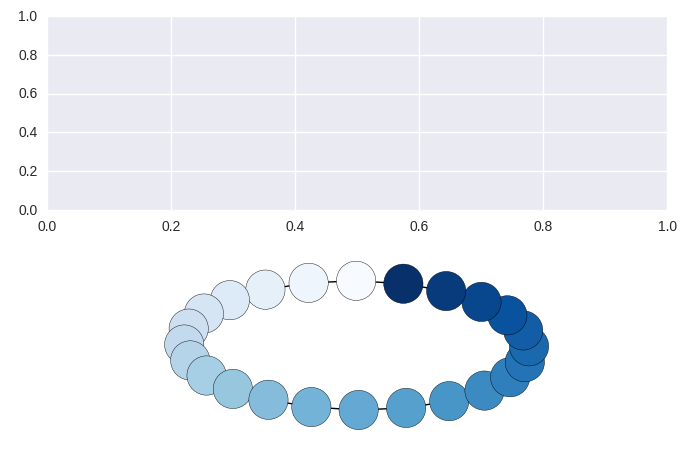

In [22]:
import matplotlib.pyplot as plt
import networkx as nx

G = nx.cycle_graph(24)
pos = nx.spring_layout(G, iterations=200)
nx.draw(G, pos, node_color=range(24), node_size=800, cmap=plt.cm.Blues)
plt.show()

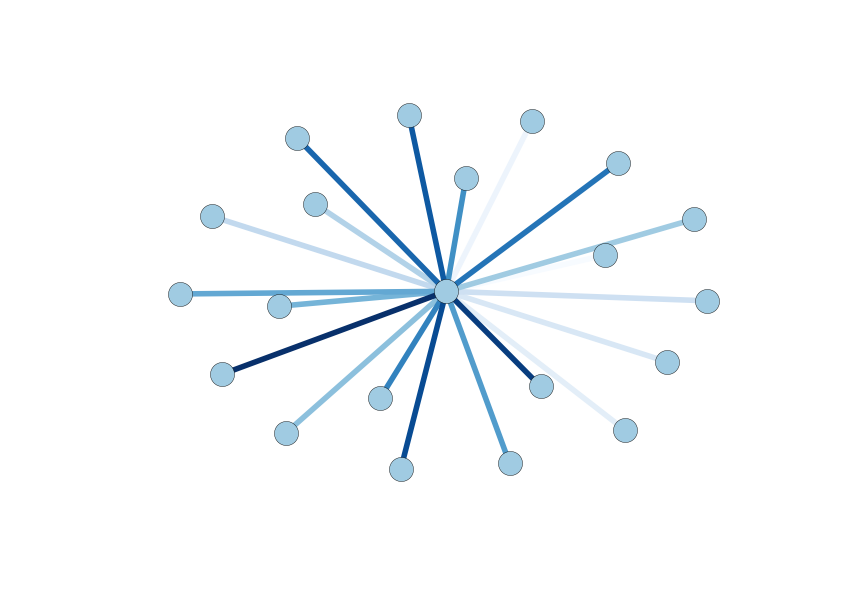

In [24]:
import matplotlib.pyplot as plt
import networkx as nx

G = nx.star_graph(20)
pos = nx.spring_layout(G)
colors = range(20)
nx.draw(G, pos, node_color='#A0CBE2', edge_color=colors,
        width=4, edge_cmap=plt.cm.Blues, with_labels=False)
plt.show()

In [109]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:24: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:64: RuntimeWarning: invalid value encountered in double_scalars


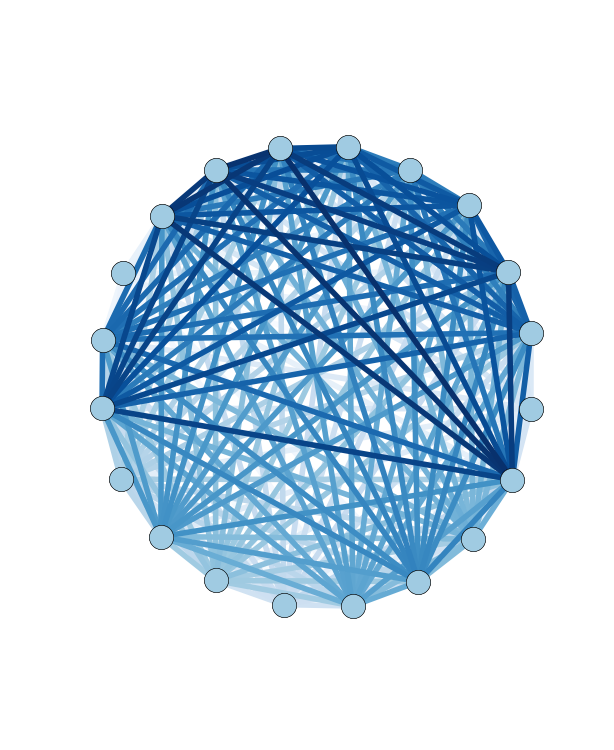

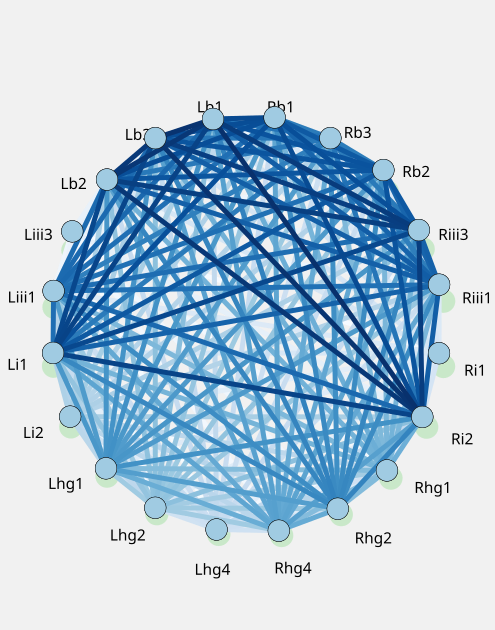

In [83]:


layout = fifi.FigureLayout('graph_layout_circular_3.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd'),
            ('left', 'hg3'), ('right', 'hg3')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(yaw_right_a.loc[yaw_right_a['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

        
        
for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.8/100000000000. for e in edges]  #3.5
    #weights2[np.isinf(weights)]=0
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**2.85/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.051] for e in G.edges] 
    #weights2[np.isinf(weights)]=0.
    #weights2[np.isnan(weights)]=0.
    
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            edge_list= G.edges,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)



import matplotlib.pyplot as plt
import networkx as nx

#colors= range(len(edges))
colors = range(210)
#G = nx.star_graph(20)
#pos = nx.spring_layout(G)
#colors = range(20)
nx.draw(G, pos = pos_dict, ax = layout.axes['network_graph_layout'], node_color='#A0CBE2', edge_color=colors, width=4, edge_cmap=plt.cm.Blues, with_labels=False)
plt.show()


layout.save('graph_WSA_increase_nfl_circ_new_rot.svg')
plt.close('all')
display(SVG('graph_WSA_increase_nfl_circ_new_rot.svg'))

In [21]:
len(G.edges)
len(edges)
len(weights2)

210

In [ ]:
ax=plt.imshow(cor_mtrx, cmap='viridis', interpolation='none')

#plt.cmap('Diverging')
sorted_keys




In [26]:


layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(WSA_increase.loc[WSA_increase['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]

ValueError: list.remove(x): x not in list

In [116]:
std_mtrx

array([[ 1.09691361,  0.78520359,  1.99720944, ...,  0.2105139 ,
         1.32514646,  0.2493976 ],
       [ 0.75727032,  0.86151242,  0.44290702, ...,  1.331117  ,
         1.99282115,  0.99840577],
       [ 0.04874031,  0.08476185, -0.79621337, ...,  1.52542799,
         1.56179393,  1.48478325],
       ..., 
       [ 1.180806  ,  0.89632344,  0.75707017, ..., -0.4026215 ,
         0.5952346 ,  0.16766618],
       [ 0.2944806 ,  0.57379552, -2.34677429, ..., -1.63258801,
        -0.92132876, -1.33140563],
       [ 1.47850462,  1.25843585, -0.3666026 , ..., -1.28957636,
        -0.8162561 , -1.62478594]])

In [65]:
cor_mtrx 
from sklearn import preprocessing
import numpy as np
# Get dataset
#df = pd.read_csv("https://storage.googleapis.com/mledudatasets/california_housing_train.csv", sep=",")
# Normalize total_bedrooms column
#x_array = np.array(df['total_bedrooms'])


#normalized_corr = preprocessing.normalize([cor_mtrx])

row_sums = cor_mtrx.sum(axis=1)
new_matrix = cor_mtrx / row_sums[:, np.newaxis]

In [70]:
cor_mtrx.sum(axis=1)

array([ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
        nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan])

In [72]:
#new_matrix

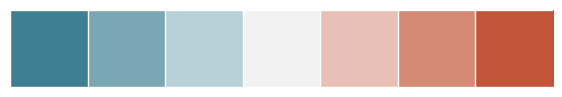

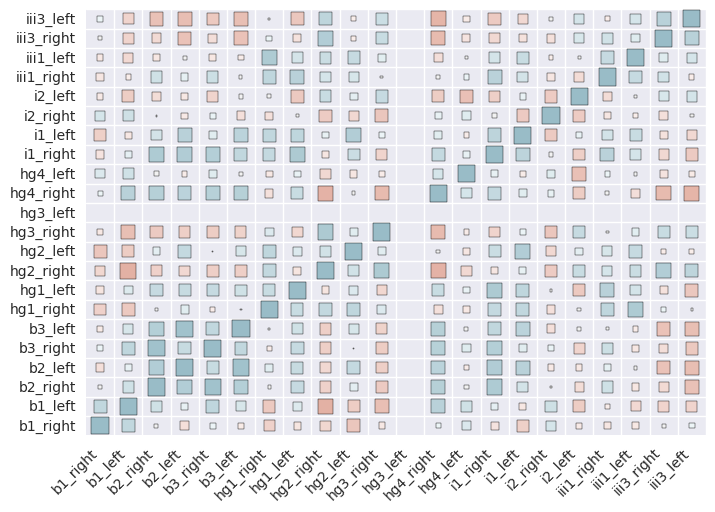

In [163]:
n_colors = 256 # Use 256 colors for the diverging color palette
palette = sns.diverging_palette(20, 220, n=n_colors) # Create the palette
color_min, color_max = [-1, 1] # Range of values that will be mapped to the palette, i.e. min and max possible correlation
sns.palplot(sns.diverging_palette(220, 20, n=7))

import matplotlib.patches as mpatch


def value_to_color(val):
    val_position = float((val - color_min)) / (color_max - color_min) # position of value in the input range, relative to the length of the input range
    ind = int(val_position * (n_colors - 1)) # target index in the color palette
    return palette[ind]

def heatmap(x, y, size, color):
    fig, ax = plt.subplots()
    
    # Mapping from column names to integer coordinates
    x_labels = [v for v in sorted(x.unique())]
    y_labels = [v for v in sorted(y.unique())]
    x_to_num = {p[1]:p[0] for p in enumerate(x_labels)} 
    y_to_num = {p[1]:p[0] for p in enumerate(y_labels)} 
    
    size_scale = 3 #500
    ax.scatter(
        x=x.map(x_to_num), # Use mapping for x
        y=y.map(y_to_num), # Use mapping for y
        s=size * size_scale,
        #color = color * size_scale,
        c=color.apply(value_to_color),# Vector of square sizes, proportional to size parameter
        marker='s' # Use square as scatterplot marker
    )


    # Show column labels on the axes
    ax.set_xticks([x_to_num[v] for v in x_labels])
    #ax.set_xticklabels(x_labels, rotation=45, horizontalalignment='right')
    ax.set_xticklabels(sorted_keys, rotation=45, horizontalalignment='right')
    ax.set_yticks([y_to_num[v] for v in y_labels])
    #ax.set_yticklabels(y_labels)
    ax.set_yticklabels(sorted_keys)
    
    ax.grid(False, 'major')
    ax.grid(True, 'minor')
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)
    
    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5]) 
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])

    
    plt.show()
    
#data = pd.read_csv('https://raw.githubusercontent.com/drazenz/heatmap/master/autos.clean.csv')
#columns = ['bore', 'stroke', 'compression-ratio', 'horsepower', 'city-mpg', 'price'] 
columns = sorted_keys
corr = cor_mtrx
corr = pd.DataFrame(cor_mtrx)
corr= corr.fillna(0)
#norm_corr=(corr-corr.min())/(corr.max()-corr.min())

#norm_corr = pd.melt(norm_corr.reset_index(), id_vars='index') # Unpivot the dataframe, so we can get pair of arrays for x and y
#norm_corr.columns = ['x', 'y', 'value']
corr2 = pd.melt(corr.reset_index(), id_vars='index') # Unpivot the dataframe, so we can get pair of arrays for x and y
corr2.columns = ['x', 'y', 'value']
corr2= corr2.fillna(0)
#norm_corr= norm_corr.fillna(0)
heatmap(
    x=corr2['x'],
    y=corr2['y'],
    size=corr2['value'].abs(),
    color = corr2['value']/100
)

In [56]:
np.shape(cor_mtrx)

(22, 22)

In [113]:
corr

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,21
0,51.000000,28.795218,-2.724106,-13.464612,5.510902,-6.258464,-21.967546,-9.974215,-18.622549,-28.960506,...,4.504314,14.639936,-11.123471,-22.903922,18.383944,-7.059634,-9.378976,-7.905232,2.382733,4.975155
1,28.795218,51.000000,21.409915,7.925422,29.736191,17.521869,-27.499096,12.945497,-42.410499,-24.914019,...,33.696479,20.843410,9.162745,-8.895037,21.813952,-24.959533,-4.861230,-17.234298,-20.113589,-20.069150
2,-2.724106,21.409915,51.000000,37.068334,46.527551,35.989821,-1.708114,27.034142,-21.591209,10.537574,...,35.509867,4.151118,39.066773,19.758577,0.473797,-14.645285,20.968454,-8.569286,-16.375315,-32.030763
3,-13.464612,7.925422,37.068334,51.000000,26.025279,46.060493,11.509362,25.791474,-18.260546,27.294628,...,32.406798,-5.363524,37.653935,33.339415,-7.067061,-7.607074,8.720171,2.704406,-31.404105,-34.402543
4,5.510902,29.736191,46.527551,26.025279,51.000000,28.848691,-4.673357,26.601877,-23.189060,0.307876,...,34.709068,12.261582,35.976183,11.519050,6.061003,-20.331763,22.490723,-8.490434,-13.832742,-27.220313
5,-6.258464,17.521869,35.989821,46.060493,28.848691,51.000000,-0.350523,21.501396,-23.818896,17.365750,...,35.553329,-2.648146,29.047148,32.245946,-13.697845,-3.172957,1.596728,-5.399346,-31.543920,-33.544203
6,-21.967546,-27.499096,-1.708114,11.509362,-4.673357,-0.350523,51.000000,25.117861,28.560686,29.577702,...,-12.569709,-7.770977,27.164210,28.773006,-12.387191,-2.604107,30.066092,39.117536,4.908824,0.961644
7,-9.974215,12.945497,27.034142,25.791474,26.601877,21.501396,25.117861,51.000000,-10.587742,14.130144,...,25.464763,7.118933,40.047692,29.756855,1.497563,-27.200668,33.661974,18.454259,-11.538424,-28.584362
8,-18.622549,-42.410499,-21.591209,-18.260546,-23.189060,-23.818896,28.560686,-10.587742,51.000000,20.191270,...,-41.280788,-17.870069,-9.299064,7.581316,-25.868042,24.733323,18.272089,24.660564,36.991293,30.202123
9,-28.960506,-24.914019,10.537574,27.294628,0.307876,17.365750,29.577702,14.130144,20.191270,51.000000,...,-2.232914,-9.659413,24.478229,36.864643,-17.865005,10.266319,16.927725,26.327575,-4.374253,-4.246501


In [45]:
# Step 1 - Make a scatter plot with square markers, set column names as labels

def heatmap(x, y, size):
    fig, ax = plt.subplots()
    
    # Mapping from column names to integer coordinates
    x_labels = [v for v in sorted(x.unique())]
    y_labels = [v for v in sorted(y.unique())]
    x_to_num = {p[1]:p[0] for p in enumerate(x_labels)} 
    y_to_num = {p[1]:p[0] for p in enumerate(y_labels)} 
    
    size_scale = 500
    ax.scatter(
        x=x.map(x_to_num), # Use mapping for x
        y=y.map(y_to_num), # Use mapping for y
        s=size * size_scale, # Vector of square sizes, proportional to size parameter
        marker='s' # Use square as scatterplot marker
    )
    
    # Show column labels on the axes
    ax.set_xticks([x_to_num[v] for v in x_labels])
    ax.set_xticklabels(x_labels, rotation=45, horizontalalignment='right')
    ax.set_yticks([y_to_num[v] for v in y_labels])
    ax.set_yticklabels(y_labels)
    
data = pd.read_csv('https://raw.githubusercontent.com/drazenz/heatmap/master/autos.clean.csv')
columns = ['bore', 'stroke', 'compression-ratio', 'horsepower', 'city-mpg', 'price'] 
corr = data[columns].corr()
corr = pd.melt(corr.reset_index(), id_vars='index') # Unpivot the dataframe, so we can get pair of arrays for x and y
corr.columns = ['x', 'y', 'value']
heatmap(
    x=corr['x'],
    y=corr['y'],
    size=corr['value'].abs()
)

In [46]:
ax.grid(False, 'major')
ax.grid(True, 'minor')
ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)


AttributeError: 'numpy.ndarray' object has no attribute 'grid'

In [47]:
ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5]) 
ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])

AttributeError: 'numpy.ndarray' object has no attribute 'set_xlim'

In [48]:
sns.palplot(sns.diverging_palette(220, 20, n=7))

In [49]:
sns.palplot(sns.diverging_palette(220, 20, n=7))

In [50]:
n_colors = 256 # Use 256 colors for the diverging color palette
palette = sns.diverging_palette(20, 220, n=n_colors) # Create the palette
color_min, color_max = [-1, 1] # Range of values that will be mapped to the palette, i.e. min and max possible correlation

def value_to_color(val):
    val_position = float((val - color_min)) / (color_max - color_min) # position of value in the input range, relative to the length of the input range
    ind = int(val_position * (n_colors - 1)) # target index in the color palette
    return palette[ind]

ax.scatter(
    x=x.map(x_to_num),
    y=y.map(y_to_num),
    s=size * size_scale,
    c=color.apply(value_to_color), # Vector of square color values, mapped to color palette
    marker='s'
)

AttributeError: 'numpy.ndarray' object has no attribute 'scatter'

In [51]:

plot_grid = plt.GridSpec(1, 15, hspace=0.2, wspace=0.1) # Setup a 1x15 grid
ax = plt.subplot(plot_grid[:,:-1]) # Use the leftmost 14 columns of the grid for the main plot

ax.scatter(
    x=x.map(x_to_num), # Use mapping for x
    y=y.map(y_to_num), # Use mapping for y
    s=size * size_scale, # Vector of square sizes, proportional to size parameter
    c=color.apply(value_to_color), # Vector of square colors, mapped to color palette
    marker='s' # Use square as scatterplot marker
)
# ...

# Add color legend on the right side of the plot
ax = plt.subplot(plot_grid[:,-1]) # Use the rightmost column of the plot

col_x = [0]*len(palette) # Fixed x coordinate for the bars
bar_y=np.linspace(color_min, color_max, n_colors) # y coordinates for each of the n_colors bars

bar_height = bar_y[1] - bar_y[0]
ax.barh(
    y=bar_y,
    width=[5]*len(palette), # Make bars 5 units wide
    left=col_x, # Make bars start at 0
    height=bar_height,
    color=palette,
    linewidth=0
)
ax.set_xlim(1, 2) # Bars are going from 0 to 5, so lets crop the plot somewhere in the middle
ax.grid(False) # Hide grid
ax.set_facecolor('white') # Make background white
ax.set_xticks([]) # Remove horizontal ticks
ax.set_yticks(np.linspace(min(bar_y), max(bar_y), 3)) # Show vertical ticks for min, middle and max
ax.yaxis.tick_right() # Show vertical ticks on the right 

NameError: name 'x' is not defined

In [52]:

plt.figure(figsize=(10, 10))
corrplot(data.corr())

NameError: name 'corrplot' is not defined

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:23: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:63: RuntimeWarning: invalid value encountered in double_scalars


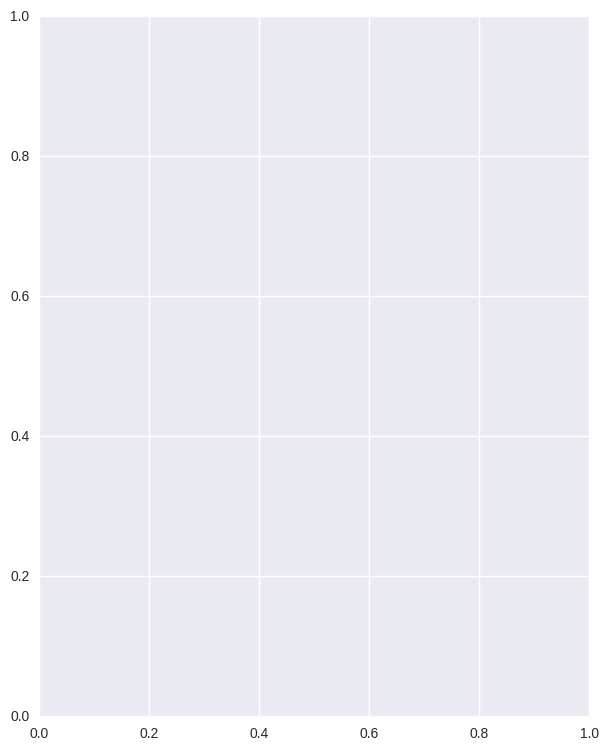

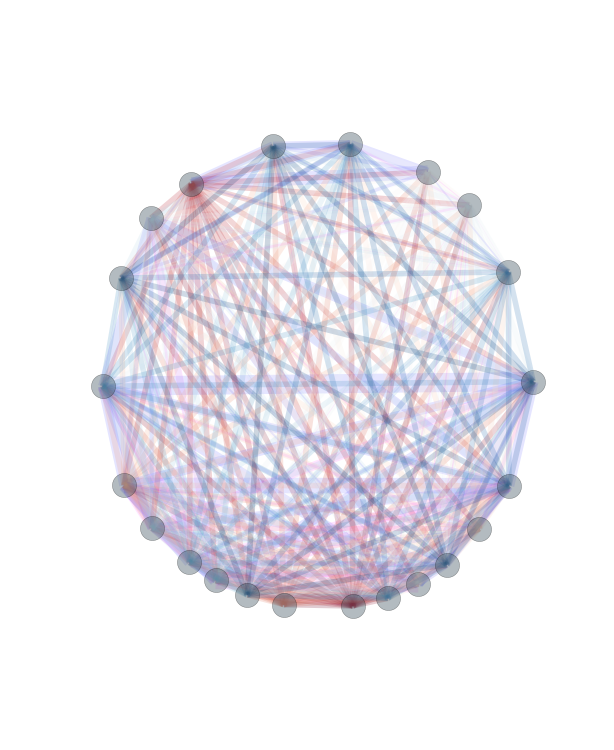

In [28]:


layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(WSA_increase.loc[WSA_increase['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

        
        
for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.8/100000000000. for e in edges]  #3.5
    #weights2[np.isinf(weights)]=0
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**2.85/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.051] for e in G.edges] 
    #weights2[np.isinf(weights)]=0.
    #weights2[np.isnan(weights)]=0.
    
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            edge_list= G.edges,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)



import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.colors as mcolors

#colors= range(len(edges))
colors = range(253)
nomie=mcolors.PowerNorm(gamma=0.5)  #)(vmin=np.min(weights2), vmax=np.max(weights2)) #LogNorm
#G = nx.star_graph(20)
#pos = nx.spring_layout(G)
#colors = range(20)
nx.draw(G, pos = pos_dict, ax = layout.axes['network_graph_layout'], node_color='#A0CBE2', edge_width = weights2, edge_color=colors, width=4, edge_cmap=plt.cm.RdBu, norm=nomie, alpha = 0.2, with_labels=False)
plt.show()


#layout.save('graph_WSA_increase_nfl_circ.svg')
#plt.close('all')
#display(SVG('graph_WSA_increase_nfl_circ.svg'))

In [43]:
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(WSA_increase.loc[WSA_increase['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    print(np.shape(cor_mtrx))
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        #print (sorted_keys)
        for j,lbl2 in enumerate(sorted_keys):
            #print(cor_mtrx[i,j])
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
print(len(G.edges))
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
#colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]
#colors_power =(G[e[0]][e[1]]['weight'], norm=colors.PowerNorm(gamma=0.5), cmap= 'RdBu') #cmap='PuBu_r')
#fig.colorbar(pcm, ax=ax[0], extend='max')
colors_power=(G[e[0]][e[1]]['weight'])#, cmap= 'RdBu')

norm_v = colors.PowerNorm(gamma=0.5)

c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]



#edge_cmap : Matplotlib colormap, optional (default=None)
#       Colormap for mapping intensities of edges

#edge_vmin,edge_vmax : floats, optional (default=None)
#Minimum and maximum for edge colormap scaling

h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

        
        
for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.8/100000000000. for e in edges]  #3.5
    #weights2[np.isinf(weights)]=0
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**2.85/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.051] for e in G.edges] 
    #weights2[np.isinf(weights)]=0.
    #weights2[np.isnan(weights)]=0.
    
    
    w_min = np.min(weights2)
    w_max = np.max(weights2)
    #edge_min = np.min(G[e[0]][e[1]])#['weight'])
    #edge_max = np.max(G[e[0]][e[1]])#['weight'])
    edges= G.edges
    weights3 = [(G[e[0]][e[1]]['weight'])]
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            #width = weights2,
            edge_cmap = 'blues', 
            #edge_cmap = plt.cm.bwr, 
            #edge_list= weights2, #G.edges,
            edge_list= edges,
            #edge_colors = range(len(G.edges)), #range(len(edge_list)),
            edge_colors =  weights2,
            #edge_color = 1
            #edge_color = colors_p, #range(len(G.edges)),
            edge_vmin = np.min(weights3),
            edge_vmax = np.max(weights3),
            #edge_cmap = plt.cm.bwr, #'bwr'
            width = weights2,
            #edge_color = len(G.edges),
            #norm = norm_v,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_WSA_increase_nfl_circ.svg')
plt.close('all')
display(SVG('graph_WSA_increase_nfl_circ.svg'))

(22, 22)
(22, 22)
(22, 22)
(22, 22)
(22, 22)
(22, 22)
(22, 22)
(22, 22)
(22, 22)
(22, 22)
(22, 22)
(22, 22)
(22, 22)
242


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in divide


AttributeError: 'list' object has no attribute 'PowerNorm'

In [ ]:
edges= G.edges
for e in edges:
    print(e)
    weights = [np.abs(G[e[0]][e[1]]['weight'])]
    print(weights)

In [253]:
h = float(layout.layout_uh)


In [235]:
colors_power


3278.9999999999886

In [298]:
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(WSA_increase.loc[WSA_increase['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

        
        
for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.8/100000000000. for e in edges]  #3.5
    #weights2[np.isinf(weights)]=0
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**2.85/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.051] for e in G.edges] 
    #weights2[np.isinf(weights)]=0.
    #weights2[np.isnan(weights)]=0.
    
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            edge_list= G.edges,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_WSA_increase_nfl_circ.svg')
plt.close('all')
display(SVG('graph_WSA_increase_nfl_circ.svg'))

ValueError: list.remove(x): x not in list

In [177]:
#range(len(G.edges))


NameError: name 'edge_collection' is not defined

In [171]:
len(edges)

242

In [85]:
print(np.shape(state_mtrx))
print(np.shape(centered_mtrx))# = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
print(np.shape(std_mtrx))# = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
print(np.shape(cor_mtrx))

(22, 8021)
(22, 8021)
(22, 8021)
(22, 22)


In [86]:
state_mtrx

array([[ 0.52653898,  0.52653898,  0.52600497, ...,  4.35237338,
         4.34570679,  4.35046586],
       [ 0.24121316,  0.24121316,  0.23731355, ...,  4.50916346,
         4.50720669,  4.54597164],
       [ 0.28706887,  0.28706887,  0.2928276 , ...,  0.01645407,
         0.        ,  0.        ],
       ..., 
       [ 0.20692929,  0.20692929,  0.22565328, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.69763987,  0.69763987,  0.69128645, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.45545049,  0.45545049,  0.4176756 , ...,  0.        ,
         0.        ,  0.        ]])

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


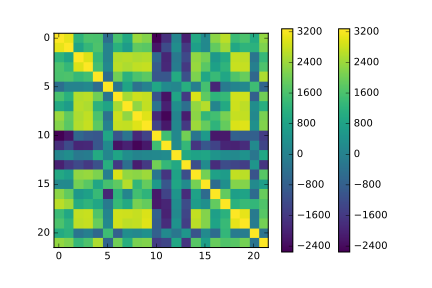

In [55]:
from matplotlib import cm
#from colorspacious import cspace_converter
from collections import OrderedDict
import matplotlib.colors as colors
from matplotlib.mlab import bivariate_normal


#cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
#cmaps['Diverging'] = ['PiBu']

ax=plt.imshow(cor_mtrx, cmap='viridis', interpolation='none')

#plt.cmap('Diverging')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)


plt.colorbar()


plt.savefig('WSA_increase_cor_matrx.svg')
plt.close('all')
display(SVG('WSA_increase_cor_matrx.svg'))

#plt.show()

In [ ]:
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]



norm_v = colors.PowerNorm(gamma=0.5)



h = float(layout.layout_uh)
pos_dict = {}
for n in sorted_keys:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

        
        
for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.8/100000000000. for e in edges]  #3.5
    #weights2[np.isinf(weights)]=0
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**2.85/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.051] for e in G.edges] 
    #weights2[np.isinf(weights)]=0.
    #weights2[np.isnan(weights)]=0.
    
    
    w_min = np.min(weights2)
    w_max = np.max(weights2)
    #edge_min = np.min(G[e[0]][e[1]])#['weight'])
    #edge_max = np.max(G[e[0]][e[1]])#['weight'])
    edges= G.edges
    weights3 = [np.abs(G[e[0]][e[1]]['weight'])]
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            #width = weights2,
            edge_cmap = 'blues', 
            #edge_cmap = plt.cm.bwr, 
            #edge_list= weights2, #G.edges,
            edge_list= edges,
            #edge_colors = range(len(G.edges)), #range(len(edge_list)),
            edge_colors =  weights3,
            #edge_color = 1
            #edge_color = colors_p, #range(len(G.edges)),
            edge_vmin = np.min(weights3),
            edge_vmax = np.max(weights3),
            #edge_cmap = plt.cm.bwr, #'bwr'
            width = weights2,
            #edge_color = len(G.edges),
            #norm = norm_v,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_WSA_increase_nfl_circ.svg')
plt.close('all')
display(SVG('graph_WSA_increase_nfl_circ.svg'))

cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(WSA_increase.loc[WSA_increase['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    print(np.shape(cor_mtrx))
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        #print (sorted_keys)
        for j,lbl2 in enumerate(sorted_keys):
            #print(cor_mtrx[i,j])
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
print(len(G.edges))
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
#colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]
#colors_power =(G[e[0]][e[1]]['weight'], norm=colors.PowerNorm(gamma=0.5), cmap= 'RdBu') #cmap='PuBu_r')
#fig.colorbar(pcm, ax=ax[0], extend='max')
colors_power=(G[e[0]][e[1]]['weight'])#, cmap= 'RdBu')

norm_v = colors.PowerNorm(gamma=0.5)


#edge_cmap : Matplotlib colormap, optional (default=None)
#       Colormap for mapping intensities of edges

#edge_vmin,edge_vmax : floats, optional (default=None)
#Minimum and maximum for edge colormap scaling

h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

        
        
for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.8/100000000000. for e in edges]  #3.5
    #weights2[np.isinf(weights)]=0
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**2.85/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.051] for e in G.edges] 
    #weights2[np.isinf(weights)]=0.
    #weights2[np.isnan(weights)]=0.
    
    
    w_min = np.min(weights2)
    w_max = np.max(weights2)
    #edge_min = np.min(G[e[0]][e[1]])#['weight'])
    #edge_max = np.max(G[e[0]][e[1]])#['weight'])
    edges= G.edges
    weights3 = [np.abs(G[e[0]][e[1]]['weight'])]
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            #width = weights2,
            edge_cmap = 'blues', 
            #edge_cmap = plt.cm.bwr, 
            #edge_list= weights2, #G.edges,
            edge_list= edges,
            #edge_colors = range(len(G.edges)), #range(len(edge_list)),
            edge_colors =  weights3,
            #edge_color = 1
            #edge_color = colors_p, #range(len(G.edges)),
            edge_vmin = np.min(weights3),
            edge_vmax = np.max(weights3),
            #edge_cmap = plt.cm.bwr, #'bwr'
            width = weights2,
            #edge_color = len(G.edges),
            #norm = norm_v,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_WSA_increase_nfl_circ.svg')
plt.close('all')
display(SVG('graph_WSA_increase_nfl_circ.svg'))

In [ ]:
from matplotlib import cm
#from colorspacious import cspace_converter
from collections import OrderedDict
import matplotlib.colors as colors
from matplotlib.mlab import bivariate_normal


#cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
#cmaps['Diverging'] = ['PiBu']

ax=plt.imshow(cor_mtrx, cmap='viridis', interpolation='none')

#plt.cmap('Diverging')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)


plt.colorbar()


plt.savefig('WSA_increase_cor_matrx.svg')
plt.close('all')
display(SVG('WSA_increase_cor_matrx.svg'))

#plt.show()

In [1]:
#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)



cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(WSA_increase.loc[WSA_increase['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

        
        
for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.8/100000000000. for e in edges]  #3.5
    
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**2.85/100000000000,False:0.00000000001}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.051] for e in G.edges] 
    
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            edge_list= G.edges,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_WSA_increase_nfl_circ.svg')
plt.close('all')
display(SVG('graph_WSA_increase_nfl_circ.svg'))

NameError: name 'fifi' is not defined

In [124]:
WSA_decrease = pitch_down

In [34]:
WSA_right_turn = multi_fly_df.loc[(multi_fly_df['left_amp'] <= mean_left_amp*.9) & (multi_fly_df['right_amp'] >= mean_right_amp*1.1)]

In [41]:
yaw_right_b = yaw_right_a.loc[(yaw_right_a['left_amp'] <= mean_left_amp*.9) & (yaw_right_a['right_amp']>= mean_right_amp*1.1)]

In [33]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:23: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:60: RuntimeWarning: invalid value encountered in double_scalars


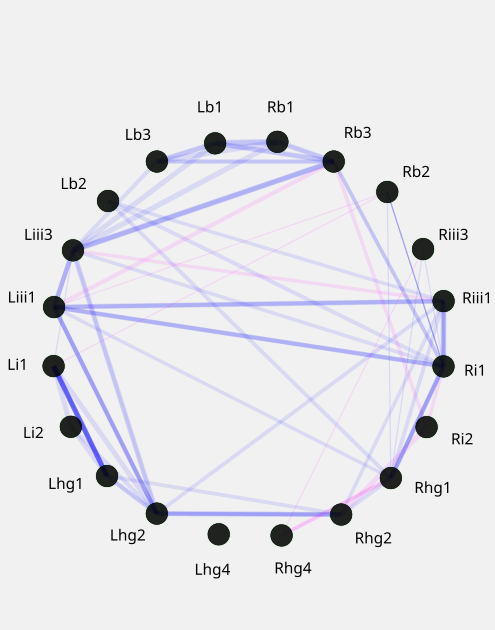

In [34]:
#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular_3.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd'),
            ('left', 'hg3'),('right', 'hg3')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(yaw_right_a.loc[yaw_right_a['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.97/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.35/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.0539] for e in G.edges] #0.0491
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            #width = weights,
            edge_color = colors,
            node_color = 'k',
            width = weights2,
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_yaw_right_circ_1.svg')
plt.close('all')
display(SVG('graph_yaw_right_circ_1.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:49: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:86: RuntimeWarning: invalid value encountered in double_scalars


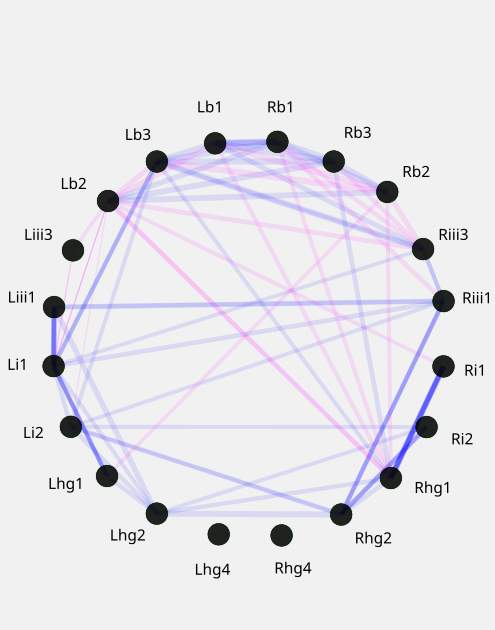

In [31]:

#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)


#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular_3.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd'),
            ('left', 'hg3'),('right', 'hg3')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(yaw_left_a.loc[yaw_left_a['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.97/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.36/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.0541] for e in G.edges] 
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            #width = weights,
            edge_color = colors,
            node_color = 'k',
            width = weights2,
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_yaw_left_circ_1.svg')
plt.close('all')
display(SVG('graph_yaw_left_circ_1.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:49: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:86: RuntimeWarning: invalid value encountered in double_scalars


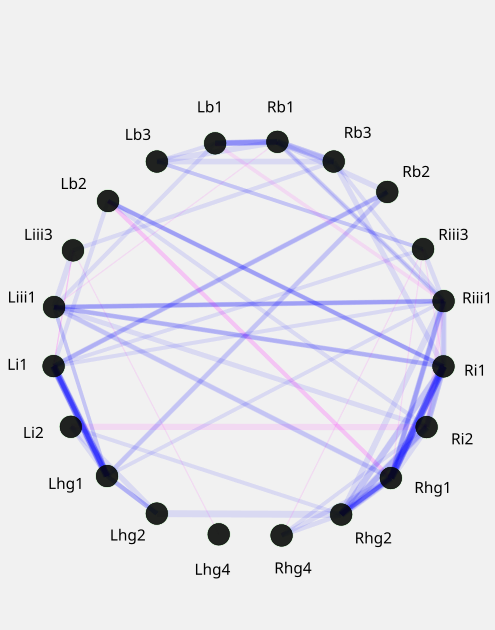

In [20]:

#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)


#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular_3.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd'),
            ('left', 'hg3'),('right', 'hg3')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(pitch_up_a.loc[pitch_up_a['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.97/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.35/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.0571] for e in G.edges] #.0491
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            #width = weights,
            edge_color = colors,
            node_color = 'k',
            width = weights2,
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_pitch_up_circ_1.svg')
plt.close('all')
display(SVG('graph_pitch_up_circ_1.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:49: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:86: RuntimeWarning: invalid value encountered in double_scalars


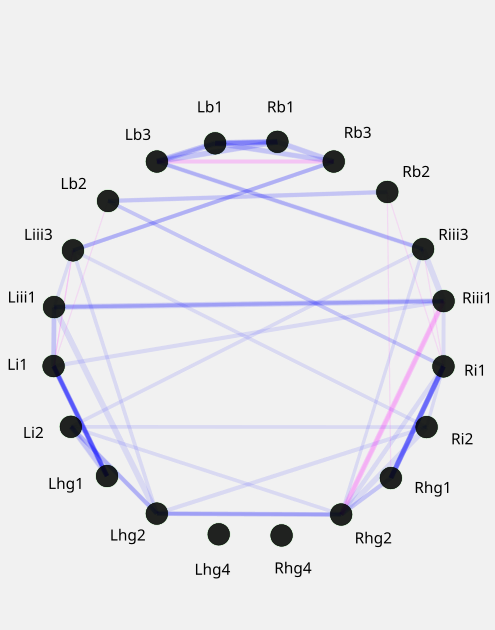

In [21]:

#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)


#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular_3.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd'),
            ('left', 'hg3'),('right', 'hg3')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(pitch_down_a.loc[pitch_down_a['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.97/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.35/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.0521] for e in G.edges] #0.0491
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            #width = weights,
            edge_color = colors,
            node_color = 'k',
            width = weights2,
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_pitch_down_circ_1.svg')
plt.close('all')
display(SVG('graph_pitch_down_circ_1.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:49: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:86: RuntimeWarning: invalid value encountered in double_scalars


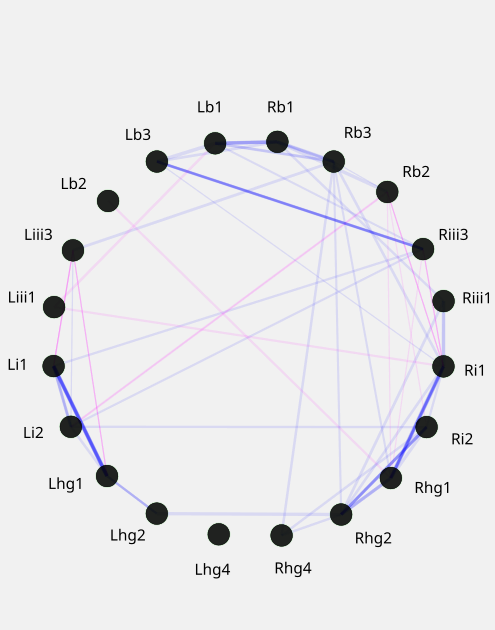

In [24]:

#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)


#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular_3.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd'),
            ('left', 'hg3'),('right', 'hg3')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(roll_cw_a.loc[roll_cw_a['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.97/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.31/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.0451] for e in G.edges] 
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            #width = weights,
            edge_color = colors,
            node_color = 'k',
            width = weights2,
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_roll_cw_circ_1.svg')
plt.close('all')
display(SVG('graph_roll_cw_circ_1.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:49: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:86: RuntimeWarning: invalid value encountered in double_scalars


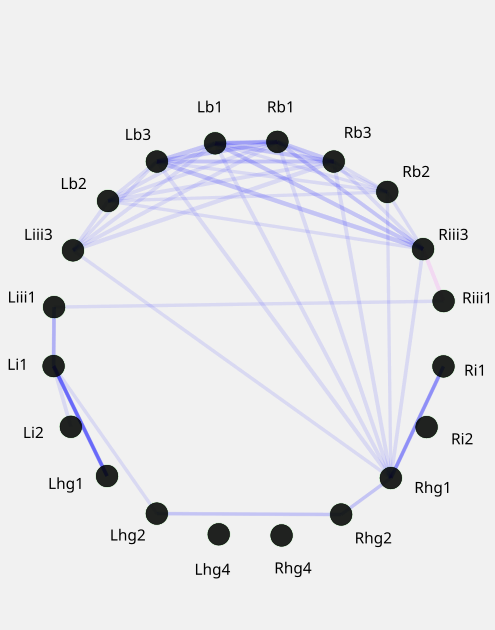

In [23]:

#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)


#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular_3.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd'),
            ('left', 'hg3'),('right', 'hg3')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(roll_ccw_a.loc[roll_ccw_a['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**2.97/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.31/100000000000,False:0.}[np.abs(G[e[0]][e[1]]['weight'])**2.85/100000000000>0.0651] for e in G.edges] 
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            #width = weights,
            edge_color = colors,
            node_color = 'k',
            width = weights2,
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_roll_ccw_circ_1.svg')
plt.close('all')
display(SVG('graph_roll_ccw_circ_1.svg'))

In [ ]:
### make sure to only take flying flies


['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


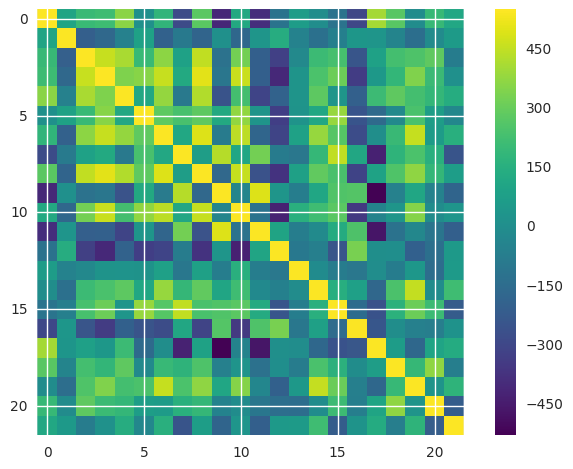

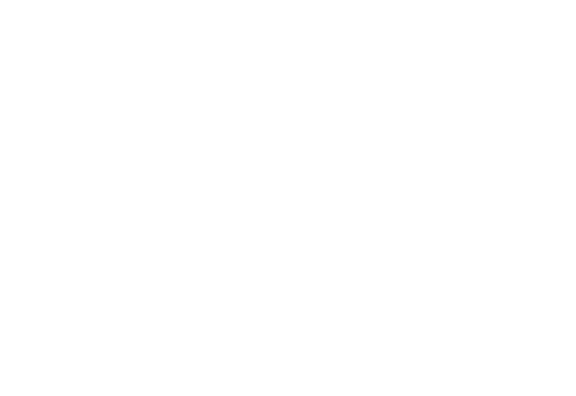

In [148]:
from matplotlib import cm
#from colorspacious import cspace_converter
from collections import OrderedDict
import matplotlib.colors as colors
from matplotlib.mlab import bivariate_normal


#cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
#cmaps['Diverging'] = ['PiBu']
fig, ax = plt.subplots()

#ax=plt.imshow(cor_mtrx, cmap='viridis', interpolation='none')
ax=plt.imshow(cor_mtrx, cmap='viridis', interpolation='none')
#ax.set_xticks([x_to_num[v] for v in x_labels])
#ax.set_xticklabels(sorted_keys, rotation=45, horizontalalignment='right')
#ax.set_yticks([y_to_num[v] for v in y_labels])
#ax.set_yticklabels(sorted_keys)
#ax.grid(False, 'major')
#ax.grid(True, 'minor')
#ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
#ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)
    
#ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5]) 
#ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])
#ax.set_xticklabels(sorted_keys, rotation=45, horizontalalignment='right')
#ax.set_yticklabels(sorted_keys)

#plt.cmap('Diverging')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)


plt.colorbar()
plt.show()

plt.savefig('WSA_decrease_cor_matrx.svg')
plt.close('all')
display(SVG('WSA_decrease_cor_matrx.svg'))

#plt.show()

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


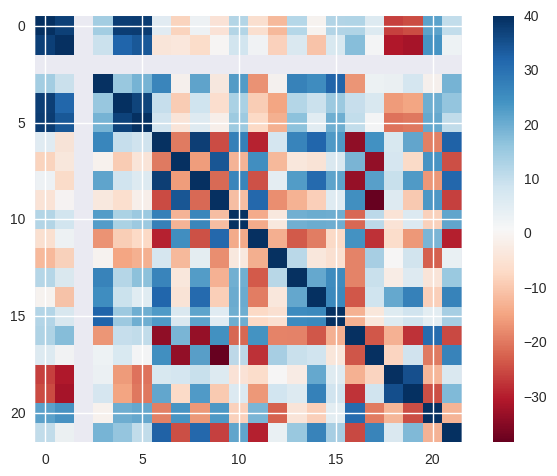

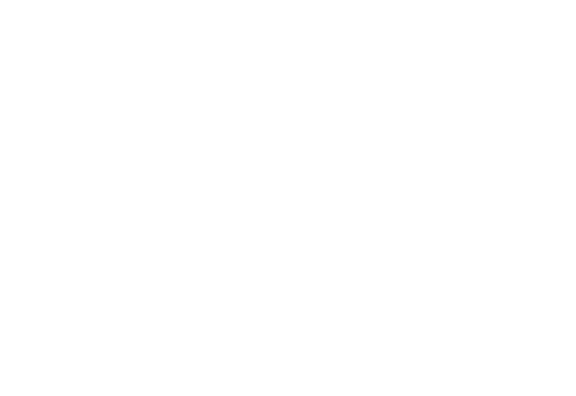

In [30]:
from matplotlib import cm
#from colorspacious import cspace_converter
from collections import OrderedDict
import matplotlib.colors as colors
from matplotlib.mlab import bivariate_normal


#cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
#cmaps['Diverging'] = ['PiBu']
fig, ax = plt.subplots()

#ax=plt.imshow(cor_mtrx, cmap='viridis', interpolation='none')
ax=plt.imshow(cor_mtrx, cmap='RdBu', interpolation='none')
#ax.set_xticks([x_to_num[v] for v in x_labels])
#ax.set_xticklabels(sorted_keys, rotation=45, horizontalalignment='right')
#ax.set_yticks([y_to_num[v] for v in y_labels])
#ax.set_yticklabels(sorted_keys)
#ax.grid(False, 'major')
#ax.grid(True, 'minor')
#ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
#ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)
    
#ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5]) 
#ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])
#ax.set_xticklabels(sorted_keys, rotation=45, horizontalalignment='right')
#ax.set_yticklabels(sorted_keys)

#plt.cmap('Diverging')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)


plt.colorbar()
plt.show()

plt.savefig('WSA_decrease_cor_matrx.svg')
plt.close('all')
display(SVG('WSA_decrease_cor_matrx.svg'))

#plt.show()

In [ ]:
from matplotlib import cm
#from colorspacious import cspace_converter
from collections import OrderedDict
import matplotlib.colors as colors
from matplotlib.mlab import bivariate_normal


#cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
#cmaps['Diverging'] = ['PiBu']

ax=plt.imshow(cor_mtrx, cmap='RdBu_r', interpolation='none')

#plt.cmap('Diverging')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)


plt.colorbar()

plt.show()

In [38]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


In [35]:
#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

#for cull in cull_list:
#    sorted_keys.remove(cull[1]+'_'+cull[0])
for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])
       
graphs = {}#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)
for flynum in fly_nums:
    df=(WSA_left_turn.loc[WSA_left_turn['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000. for e in edges]  #3.5   #2.97
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.25/100000000000,False:0.00000000001}[np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000>0.021] for e in G.edges] 
    
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_yaw_left_nfl_circ.svg')
plt.close('all')
display(SVG('graph_yaw_left_nfl_circ.svg'))

ValueError: list.remove(x): x not in list

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:22: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:59: RuntimeWarning: invalid value encountered in double_scalars


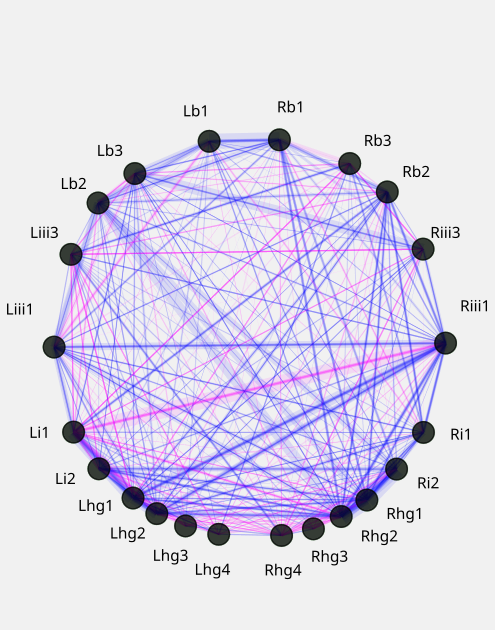

In [79]:
#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(WSA_right_turn.loc[WSA_right_turn['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.15/100000000000,False:0.00000000001}[np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000>0.041] for e in G.edges] 
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_yaw_right_circ.svg')
plt.close('all')
display(SVG('graph_yaw_right_circ.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


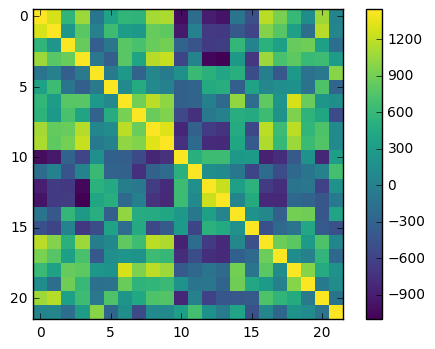

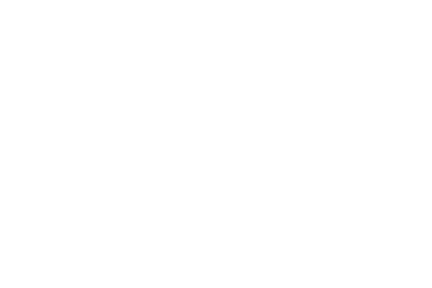

In [80]:
from matplotlib import cm
#from colorspacious import cspace_converter
from collections import OrderedDict
import matplotlib.colors as colors
from matplotlib.mlab import bivariate_normal


#cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
#cmaps['Diverging'] = ['PiBu']

ax=plt.imshow(cor_mtrx, cmap='viridis', interpolation='none')

#plt.cmap('Diverging')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)


plt.colorbar()
plt.show()

plt.savefig('yaw_right_cor_matrx.svg')
plt.close('all')
display(SVG('yaw_right_cor_matrx.svg'))

#plt.show()

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:22: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:59: RuntimeWarning: invalid value encountered in double_scalars


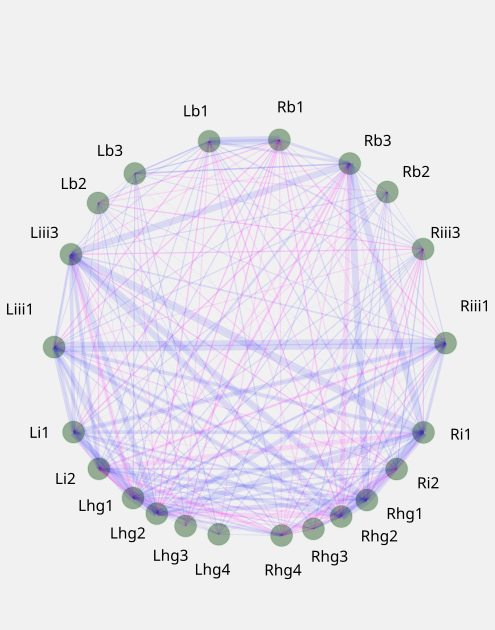

In [39]:
#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(WSA_left_turn.loc[WSA_left_turn['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**2.85/100000000000,False:0.00000000001}[np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000>0.041] for e in G.edges] 
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_yaw_left_circ.svg')
plt.close('all')
display(SVG('graph_yaw_left_circ.svg'))

In [45]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:59: RuntimeWarning: invalid value encountered in double_scalars


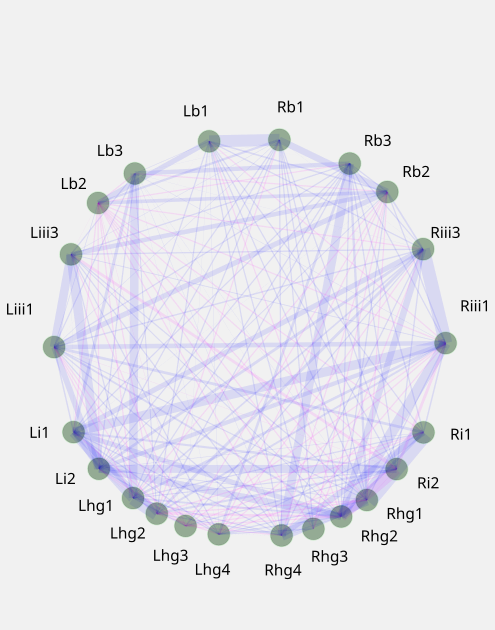

In [46]:
#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(WSA_right_turn.loc[WSA_right_turn['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**2.65/100000000000,False:0.00000000001}[np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000>0.041] for e in G.edges] 
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_right_turn_circ.svg')
plt.close('all')
display(SVG('graph_right_turn_circ.svg'))

In [61]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:59: RuntimeWarning: invalid value encountered in double_scalars


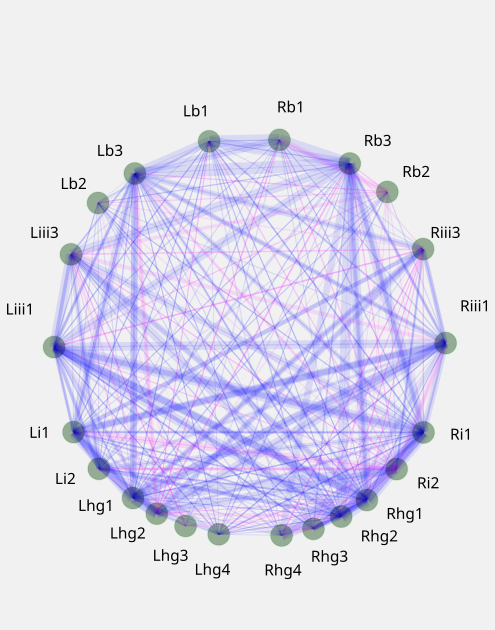

In [62]:
#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(yaw_right_a.loc[yaw_right_a['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.35/100000000000,False:0.00000000001}[np.abs(G[e[0]][e[1]]['weight'])**3.25/100000000000>0.041] for e in G.edges] 
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_yaw_r_circ.svg')
plt.close('all')
display(SVG('graph_yaw_r_circ.svg'))

In [65]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:59: RuntimeWarning: invalid value encountered in double_scalars


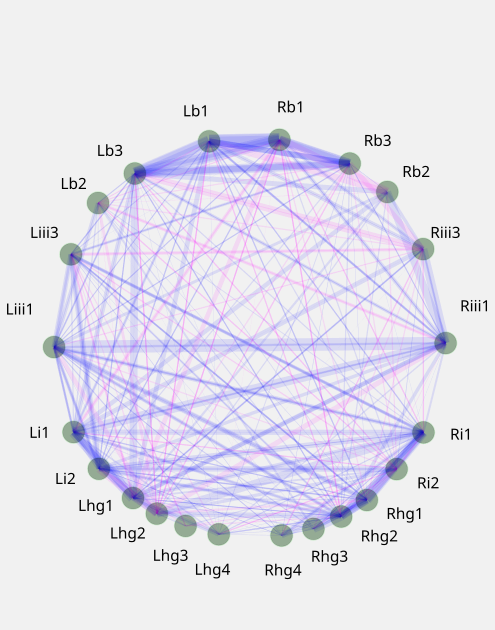

In [66]:
#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(roll_ccw_a.loc[roll_ccw_a['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.35/100000000000,False:0.00000000001}[np.abs(G[e[0]][e[1]]['weight'])**3.25/100000000000>0.041] for e in G.edges] 
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_roll_ccw_circ.svg')
plt.close('all')
display(SVG('graph_roll_ccw_circ.svg'))

In [67]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:59: RuntimeWarning: invalid value encountered in double_scalars


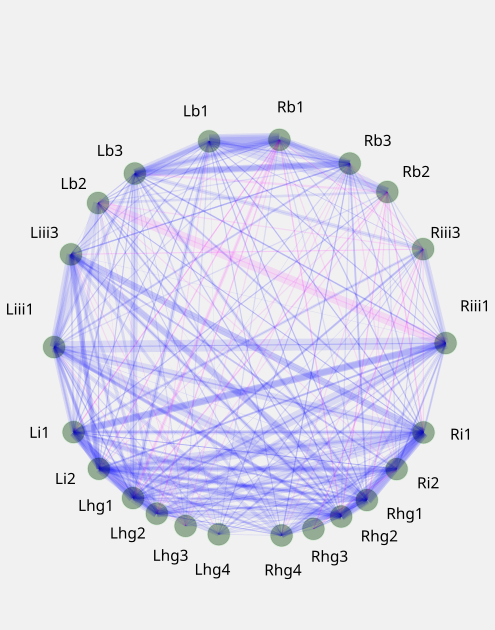

In [68]:
#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(roll_cw_a.loc[roll_cw_a['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.35/100000000000,False:0.00000000001}[np.abs(G[e[0]][e[1]]['weight'])**3.25/100000000000>0.041] for e in G.edges] 
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_roll_cw_circ.svg')
plt.close('all')
display(SVG('graph_roll_cw_circ.svg'))

In [69]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:59: RuntimeWarning: invalid value encountered in double_scalars


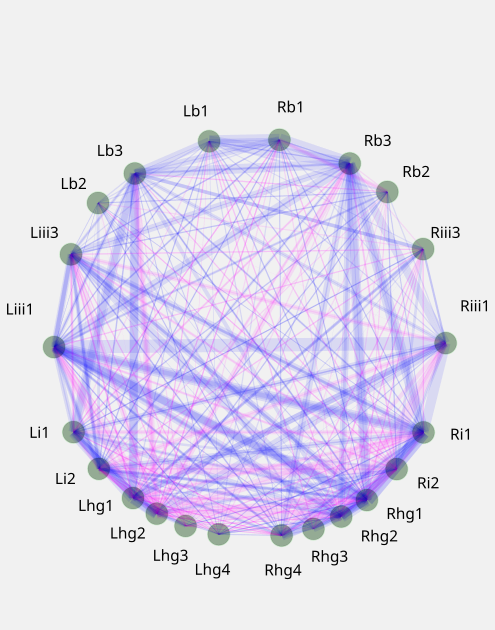

In [70]:
#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)
layout = fifi.FigureLayout('graph_layout_circular.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(pitch_up_a.loc[pitch_up_a['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.35/100000000000,False:0.00000000001}[np.abs(G[e[0]][e[1]]['weight'])**3.25/100000000000>0.041] for e in G.edges] 
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_pitch_up_circ.svg')
plt.close('all')
display(SVG('graph_pitch_up_circ.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


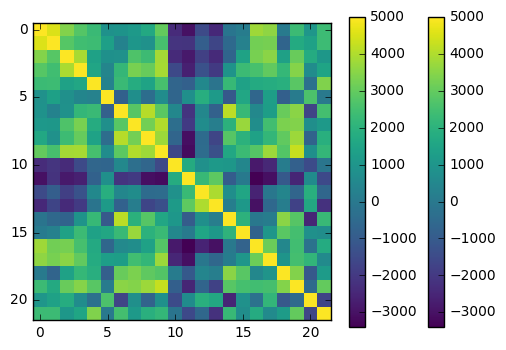

In [76]:
from matplotlib import cm
#from colorspacious import cspace_converter
from collections import OrderedDict
import matplotlib.colors as colors
from matplotlib.mlab import bivariate_normal


#cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
#cmaps['Diverging'] = ['PiBu']

ax=plt.imshow(cor_mtrx, cmap='viridis', interpolation='none')

#plt.cmap('Diverging')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)


plt.colorbar()
plt.show()

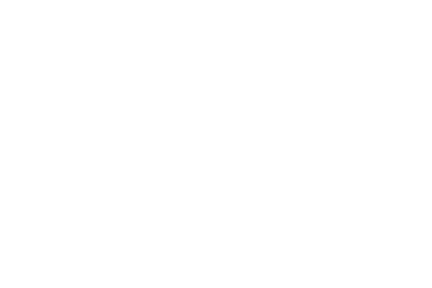

In [77]:
plt.savefig('yaw_left_cor_matrx.svg')
plt.close('all')
display(SVG('yaw_left_cor_matrx.svg'))

#plt.show()

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


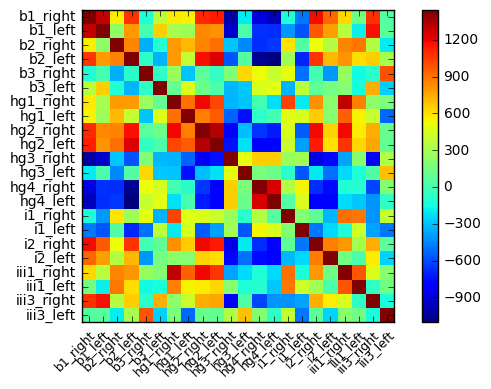

In [121]:
#import numpy as np; np.random.seed(0)
#import seaborn as sns; sns.set()

#ax=plt.imshow(cor_mtrx, interpolation='none')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)


fig, ax = plt.subplots()

im = ax.imshow(cor_mtrx, interpolation='none')


# Create colorbar
cbar = ax.figure.colorbar(im, ax=ax)
#cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")


#plt.axis(sorted_keys, sorted_keys);
#plt.yticks(sorted_keys);
ax.set_xticks(np.arange(len(sorted_keys)))
ax.set_yticks(np.arange(len(sorted_keys)))

ax.set_xticklabels(sorted_keys, fontsize = 9)
ax.set_yticklabels(sorted_keys)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor", fontsize = 9)
#ax.yaxis.set_major_locator(sorted_keys)

#ax1 = sns.heatmap(cor_matrx, annot=True, fmt="d")
#ax1.xticklabels(sorted_keys)


fig.tight_layout()
plt.show()

#plt.colorbar()
#plt.show()

##set heat map labels and colors
##check color scale/value is properly centerd

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:58: RuntimeWarning: invalid value encountered in double_scalars


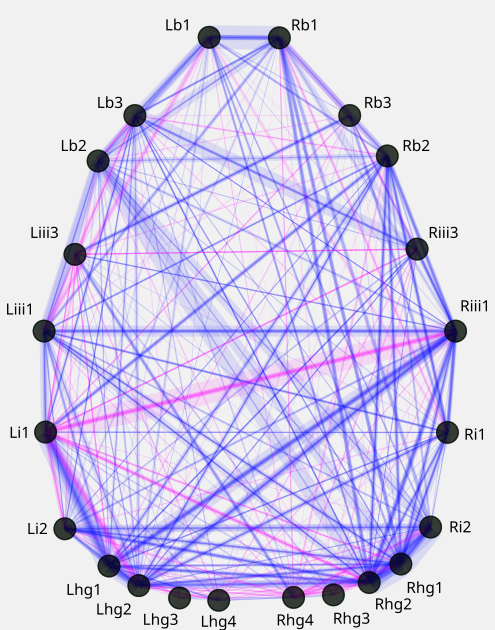

In [23]:
layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(WSA_right_turn.loc[WSA_right_turn['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000. for e in edges]  #3.5
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.20/100000000000,False:0.0000000000}[np.abs(G[e[0]][e[1]]['weight'])**3.05/100000000000>0.071] for e in G.edges] 
    
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_yaw_left_nfl.svg')
plt.close('all')
display(SVG('graph_yaw_left_nfl.svg'))

In [30]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:60: RuntimeWarning: invalid value encountered in double_scalars


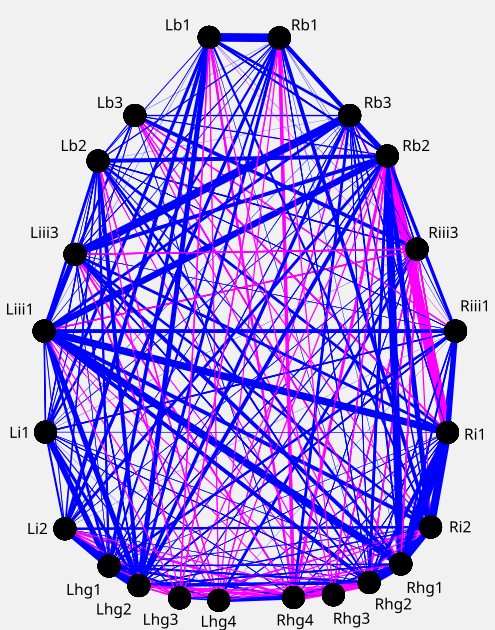

In [31]:
layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(WSA_left_turn.loc[WSA_left_turn['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.15/100000000000. for e in edges]  #3.5
    
    alpha2 = [{True:0.01,False: 0.0}[np.abs(G[e[0]][e[1]]['weight'])>5000.] for e in G.edges] 
    
    weights2 = [{True:G[e[0]][e[1]]['weight']**3.20/100000000000,False:0.0000000000}[np.abs(G[e[0]][e[1]]['weight'])**3.05/100000000000>0.055] for e in G.edges] 
    #alpha2 = [{True:0.1,False:0}[np.abs(G[e[0]][e[1]]['weight'])**3.05/100000000000>0.15] for e in G.edges] 
    
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights2,
            edge_color = colors,
            node_color = 'k',
            node_alpha = 0.1,
            edge_alpha = alpha2)
            #alpha = alpha2)
            #alpha = 0.1)
    
        
        
    # nodes
    #nx.draw_networkx_nodes(G,
    #                  ax = layout.axes['network_graph_layout']
    #                   pos = pos_dict,
    #                   #nodelist=[0,1,2,3],
    #                   node_color='k',
    #                   font_color = 'r'
    #                   #node_size=500,
    #                   alpha=0.8)
    #nx.draw_networkx_nodes(G,pos,
    #                   nodelist=[4,5,6,7],
    #                   node_color='b',
    #                   node_size=500,
    #                   alpha=0.8)

    # edges
    #nx.draw_networkx_edges(G,pos,width=1.0,alpha=0.5)
    #nx.draw_networkx_edges(G,pos,
    #                   edgelist=[(0,1),(1,2),(2,3),(3,0)],
    #                   width=8,alpha=0.5,edge_color='r')
    #nx.draw_networkx_edges(G,pos,
    #                   edgelist=[(4,5),(5,6),(6,7),(7,4)],
    #                   width=8,alpha=0.5,edge_color='b')

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_yaw_left_nfl.svg')
plt.close('all')
display(SVG('graph_yaw_left_nfl.svg'))

In [27]:
np.abs(G[e[0]][e[1]]['weight'])

5005.0000000000127

YAW right

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in divide


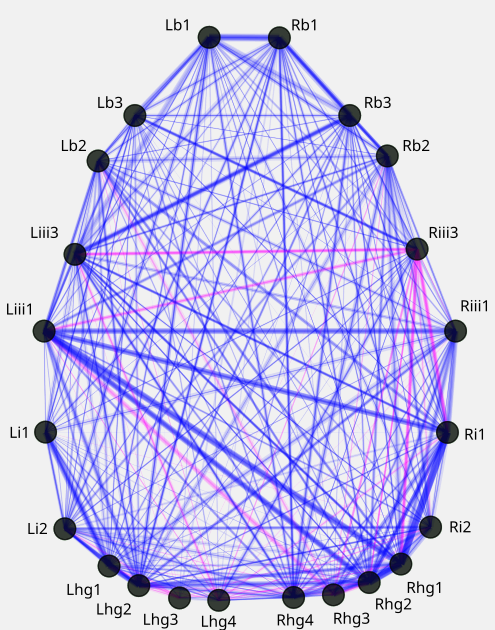

In [12]:
layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(filtered_df_yaw_left.loc[filtered_df_yaw_left['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.45/100000000000. for e in edges]  #3.5
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_yaw_left.svg')
plt.close('all')
display(SVG('graph_yaw_left.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


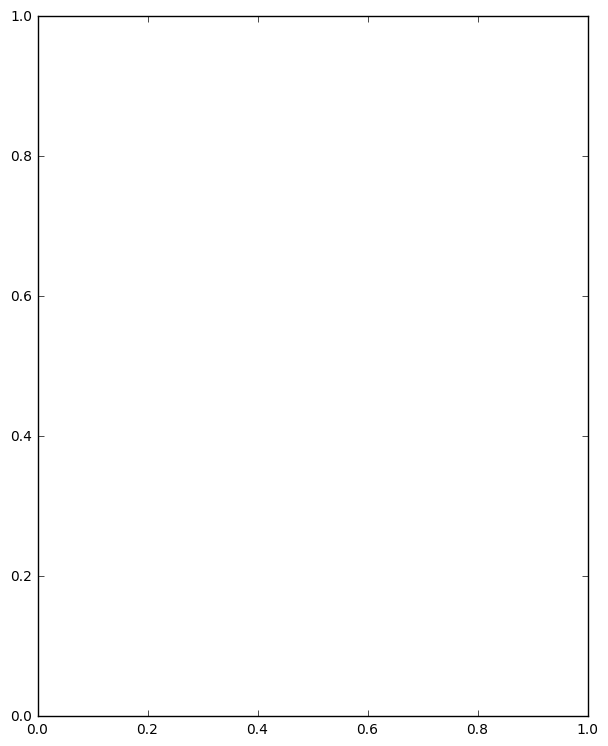

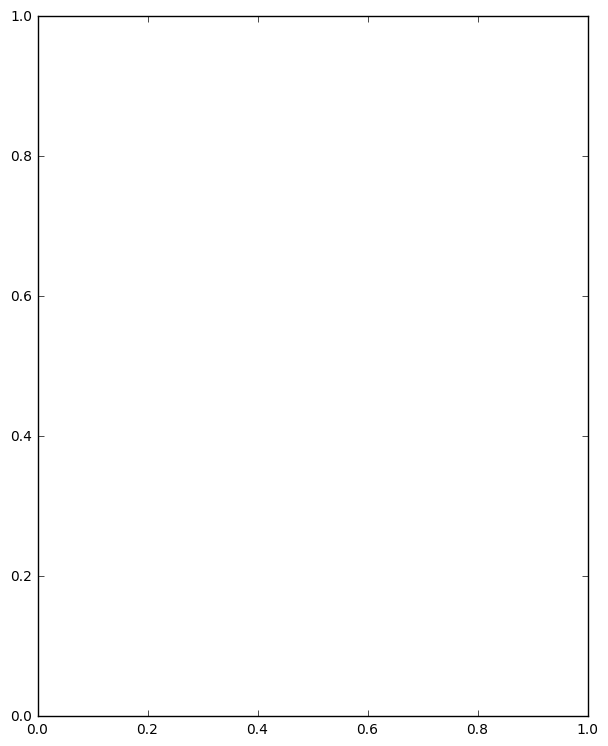

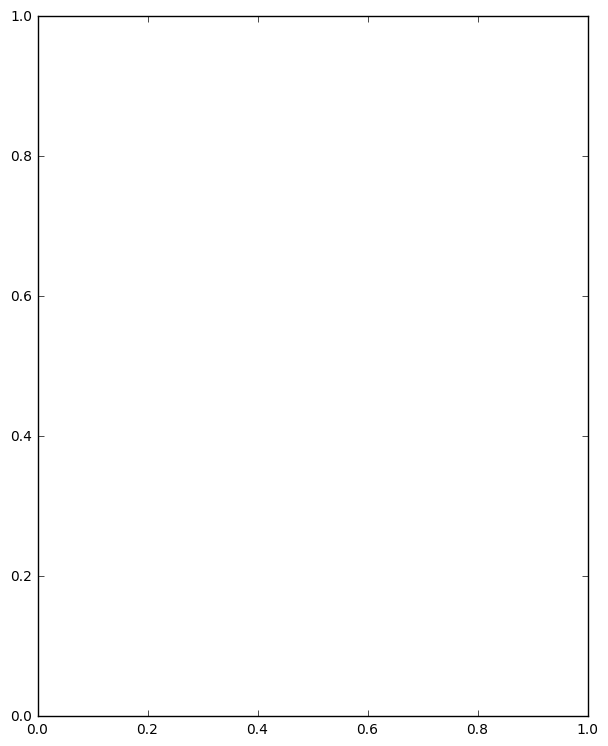

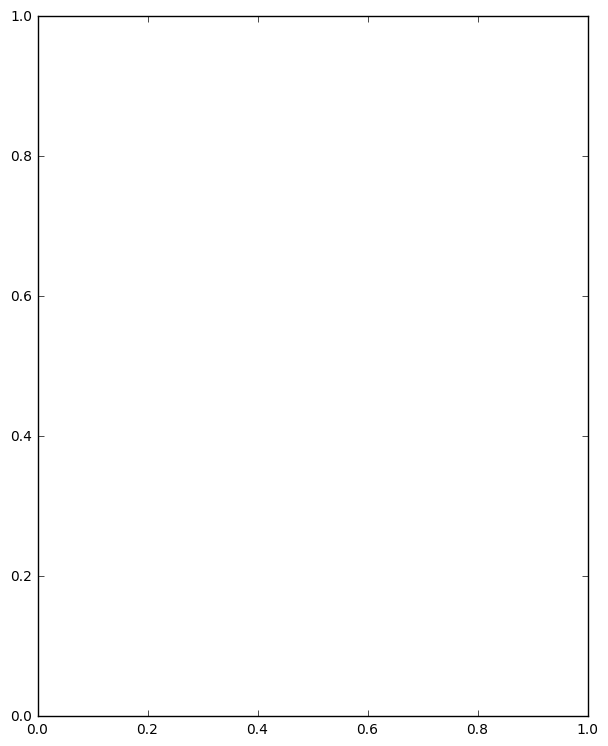

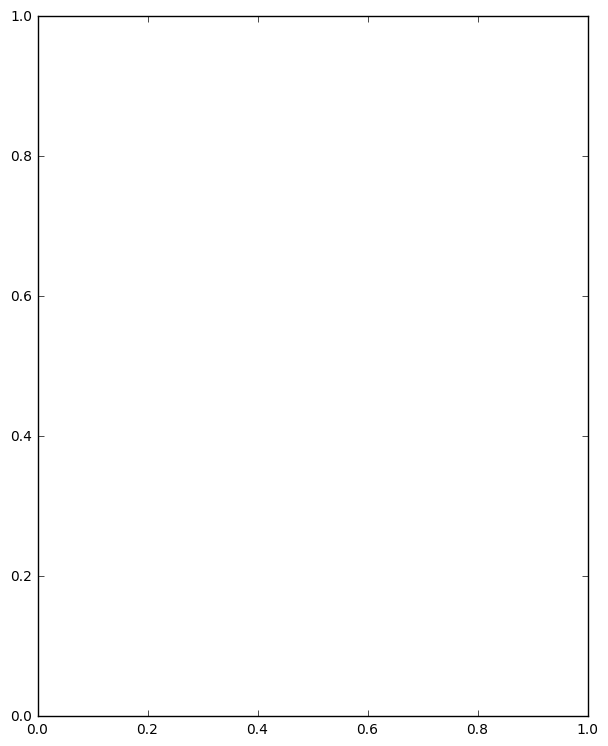

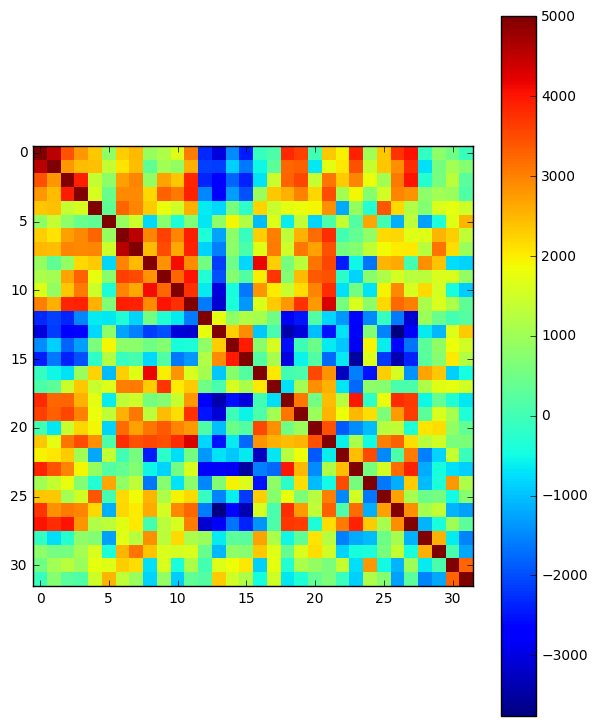

In [36]:
ax=plt.imshow(cor_mtrx, interpolation='none')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)
plt.colorbar()
plt.show()

##set heat map labels and colors
##check color scale/value is properly centerd


In [ ]:
YAW left

In [37]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


In [198]:
#filtered_df= multi_fly_df.loc[multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=-8, b_y=0, ch=True']
#filtered_df= multi_fly_df
filtered_df_yaw_right= multi_fly_df.loc[multi_fly_df['stimulus']== 'ol_blocks, g_x=-12, g_y=0 b_x=0, b_y=0'] #'cl_blocks, g_x=-1, g_y=-4 b_x=-8, b_y=0']
#filtered_df= multi_fly_df.loc(multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=0, b_y=0, ch=False')
#print(filtered_df.head())

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in divide


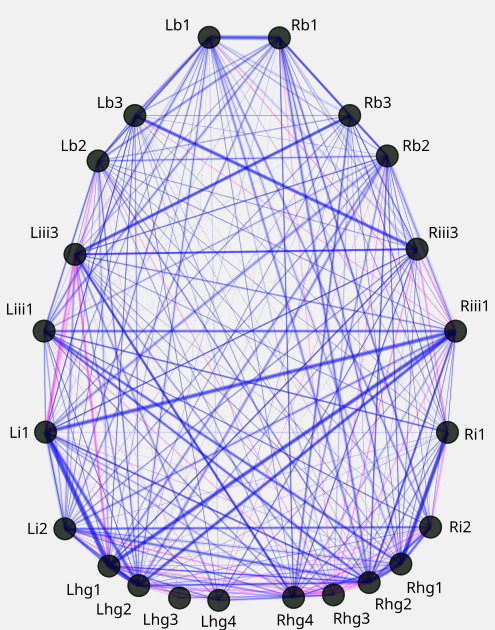

In [199]:
layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(filtered_df_yaw_right.loc[filtered_df_yaw_right['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.4/100000000000. for e in edges]  #3.5
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_yaw_left.svg')
plt.close('all')
display(SVG('graph_yaw_left.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


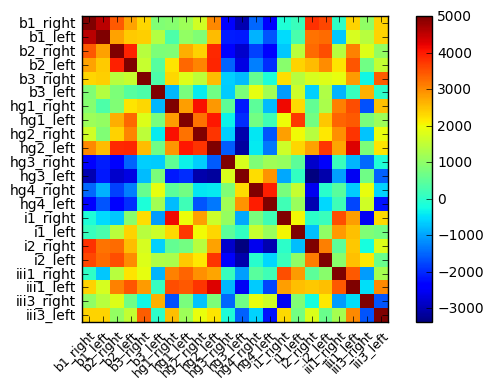

In [118]:
#import numpy as np; np.random.seed(0)
#import seaborn as sns; sns.set()

#ax=plt.imshow(cor_mtrx, interpolation='none')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)


fig, ax = plt.subplots()

im = ax.imshow(cor_mtrx, interpolation='none')


# Create colorbar
cbar = ax.figure.colorbar(im, ax=ax)
#cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")


#plt.axis(sorted_keys, sorted_keys);
#plt.yticks(sorted_keys);
ax.set_xticks(np.arange(len(sorted_keys)))
ax.set_yticks(np.arange(len(sorted_keys)))

ax.set_xticklabels(sorted_keys, fontsize = 9)
ax.set_yticklabels(sorted_keys)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor", fontsize = 9)
#ax.yaxis.set_major_locator(sorted_keys)

#ax1 = sns.heatmap(cor_matrx, annot=True, fmt="d")
#ax1.xticklabels(sorted_keys)


fig.tight_layout()
plt.show()

#plt.colorbar()
#plt.show()

##set heat map labels and colors
##check color scale/value is properly centerd


In [162]:
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


In [164]:
df[sorted_keys[1]].head()

573192    4.841871
573193    4.824967
573194    4.824967
573195    4.821457
573196    4.821457
Name: b1_left, dtype: float64

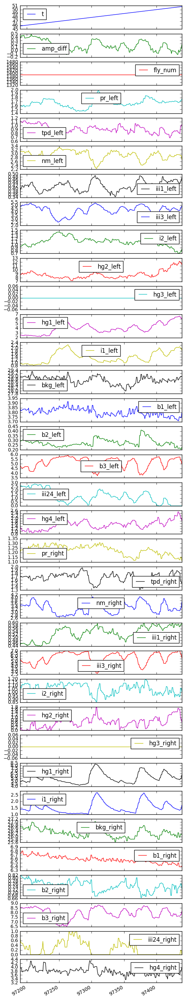

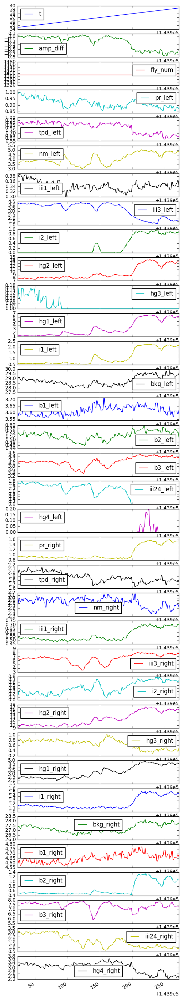

In [177]:
for flynum in fly_nums[2: 4]: 
    df=(filtered_df_yaw_right.loc[filtered_df_yaw_right['fly_num']==flynum])
    df = df[0:250]
    df.plot(subplots=True, figsize=(6, 40)); plt.legend(loc='best')
    plt.show()

In [ ]:
PITCH (1)  UP?  Translation up

In [201]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


In [202]:
#filtered_df= multi_fly_df.loc[multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=-8, b_y=0, ch=True']
#filtered_df= multi_fly_df
filtered_df_pitch_down= multi_fly_df.loc[multi_fly_df['stimulus']== 'ol_blocks, g_x=0, g_y=-4 b_x=0, b_y=0'] #'cl_blocks, g_x=-1, g_y=-4 b_x=-8, b_y=0']
#filtered_df= multi_fly_df.loc(multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=0, b_y=0, ch=False')
#print(filtered_df.head())

#'ol_blocks, g_x=0, g_y=-4 b_x=0, b_y=0

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in divide


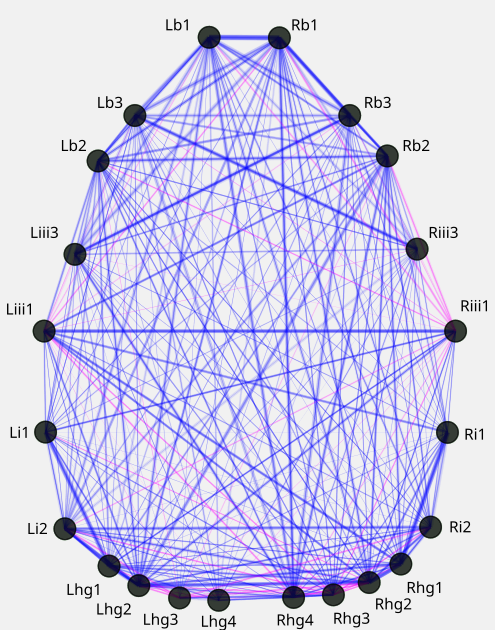

In [203]:
layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(filtered_df_pitch_down.loc[filtered_df_pitch_down['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.40/100000000000. for e in edges]    #3.5
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_pitch_up.svg')
plt.close('all')
display(SVG('graph_pitch_up.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


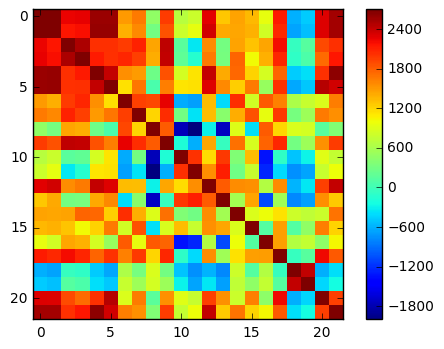

In [204]:
ax=plt.imshow(cor_mtrx, interpolation='none')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)
plt.colorbar()
plt.show()

##set heat map labels and colors
##check color scale/value is properly centerd


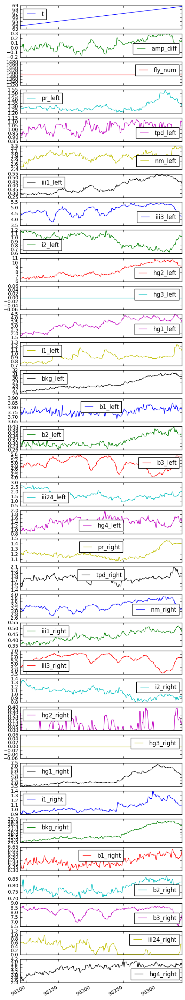

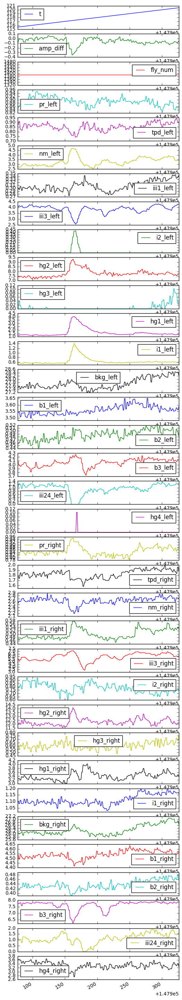

In [186]:
for flynum in fly_nums[2: 4]: 
    df=(filtered_df_pitch_down.loc[filtered_df_pitch_down['fly_num']==flynum])
    df = df[0:250]
    df.plot(subplots=True, figsize=(6, 40)); plt.legend(loc='best')
    plt.show()

In [ ]:
PITCH (2)  up? translation down

In [205]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


In [206]:
#filtered_df= multi_fly_df.loc[multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=-8, b_y=0, ch=True']
#filtered_df= multi_fly_df
filtered_df_pitch_up= multi_fly_df.loc[multi_fly_df['stimulus']== 'ol_blocks, g_x=0, g_y=4 b_x=0, b_y=0'] #'cl_blocks, g_x=-1, g_y=-4 b_x=-8, b_y=0']
#filtered_df= multi_fly_df.loc(multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=0, b_y=0, ch=False')
#print(filtered_df.head())

#'ol_blocks, g_x=0, g_y=-4 b_x=0, b_y=0

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in divide


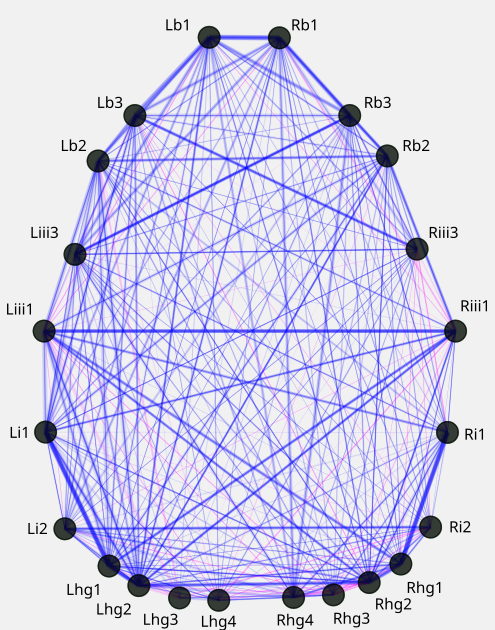

In [207]:
layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(filtered_df_pitch_up.loc[filtered_df_pitch_up['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.40/100000000000. for e in edges]  #3.5
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_pitch_down.svg')
plt.close('all')
display(SVG('graph_pitch_down.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


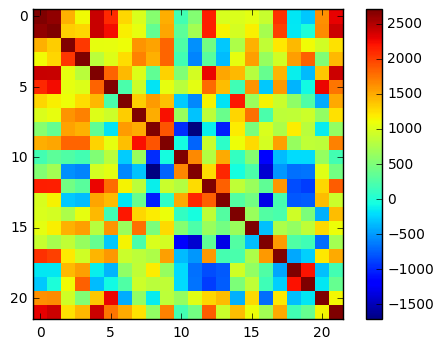

In [208]:
ax=plt.imshow(cor_mtrx, interpolation='none')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)
plt.colorbar()
plt.show()

##set heat map labels and colors
##check co



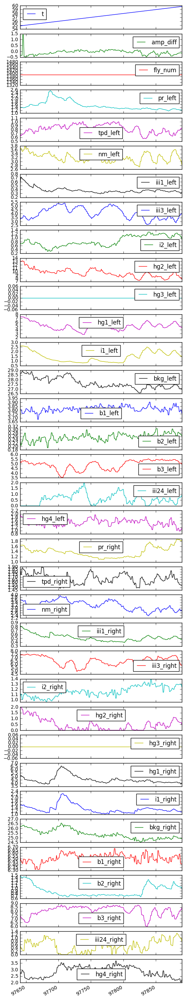

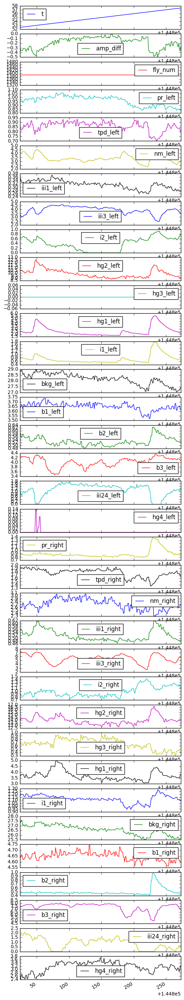

In [191]:
for flynum in fly_nums[2: 4]: 
    df=(filtered_df_pitch_up.loc[filtered_df_pitch_up['fly_num']==flynum])
    df = df[0:250]
    df.plot(subplots=True, figsize=(6, 40)); plt.legend(loc='best')
    plt.show()

In [ ]:
CL PITCH UP


In [138]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


In [139]:
#filtered_df= multi_fly_df.loc[multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=-8, b_y=0, ch=True']
#filtered_df= multi_fly_df
filtered_df_pitch_up= multi_fly_df.loc[multi_fly_df['stimulus']== 'cl_blocks, g_x=-1, g_y=-4 b_x=0, b_y=0'] #'cl_blocks, g_x=-1, g_y=-4 b_x=-8, b_y=0']
#filtered_df= multi_fly_df.loc(multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=0, b_y=0, ch=False')
#print(filtered_df.head())

#'ol_blocks, g_x=0, g_y=-4 b_x=0, b_y=0

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in divide


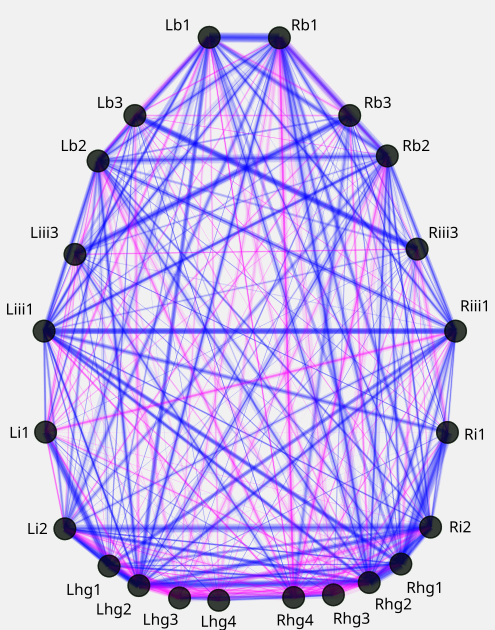

In [140]:
layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(filtered_df_pitch_up.loc[filtered_df_pitch_up['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.5/100000000000. for e in edges]  #3.5
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_pitch_2.svg')
plt.close('all')
display(SVG('graph_pitch_2.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


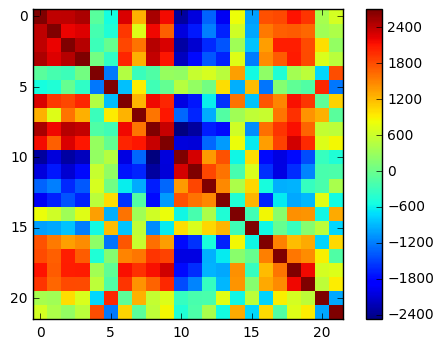

In [141]:
ax=plt.imshow(cor_mtrx, interpolation='none')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)
plt.colorbar()
plt.show()

##set heat map labels and colors
##check co


In [ ]:
CL PITCH UP


In [134]:
#print(filtered_df[key+'_right'])

#flynumbers = list(range(1389,1402))
#flynumbers = list(range(1548,1549))
#flylist = [flb.NetFly(fnum,rootpath='/media/imager/FlyDataD/FlyDB/') for fnum in flynumbers]
#l = [fly.open_signals() for fly in flylist]
#fly = flylist[4]
#fly.open_signals()
fly = flb.NetFly(1540)
fly.open_signals()

general_sorted_keys = sorted(fly.ca_cam_left_model_fits.keys())
#print(sorted(fly.ca_cam_left_model_fits.keys()))

sorted_keys = []

for key in general_sorted_keys:
    key2= key+'_right'
    key3= key+'_left'
    sorted_keys.append(key2)
    sorted_keys.append(key3)
    
print(sorted_keys)

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'bkg_right', 'bkg_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii24_right', 'iii24_left', 'iii3_right', 'iii3_left', 'nm_right', 'nm_left', 'pr_right', 'pr_left', 'tpd_right', 'tpd_left']


In [135]:
#filtered_df= multi_fly_df.loc[multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=-8, b_y=0, ch=True']
#filtered_df= multi_fly_df
filtered_df_pitch_up= multi_fly_df.loc[multi_fly_df['stimulus']== 'cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0'] #'cl_blocks, g_x=-1, g_y=-4 b_x=-8, b_y=0']
#filtered_df= multi_fly_df.loc(multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=0, b_y=0, ch=False')
#print(filtered_df.head())

#'ol_blocks, g_x=0, g_y=-4 b_x=0, b_y=0

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in divide


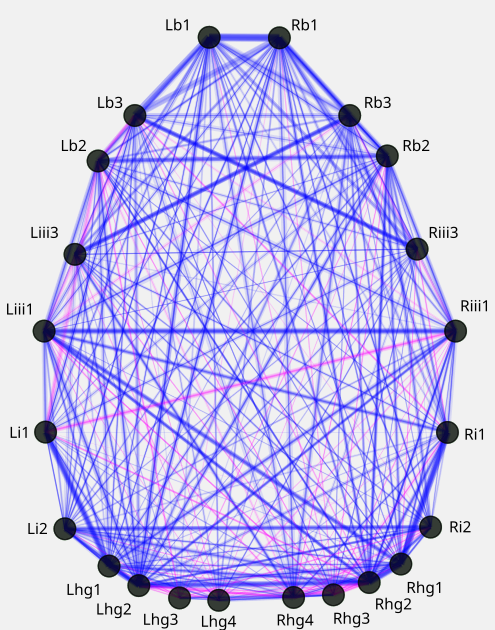

In [136]:
layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(filtered_df_pitch_up.loc[filtered_df_pitch_up['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.45/100000000000. for e in edges]  #3.5
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_pitch_2.svg')
plt.close('all')
display(SVG('graph_pitch_2.svg'))

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


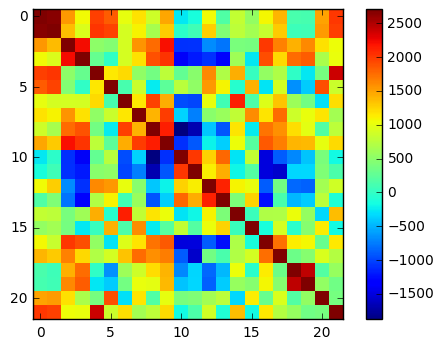

In [137]:
ax=plt.imshow(cor_mtrx, interpolation='none')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)
plt.colorbar()
plt.show()

##set heat map labels and colors
##check co


In [248]:
#print(filtered_df)

In [254]:
#filtered_df= multi_fly_df.loc[multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=-8, b_y=0, ch=True']
#filtered_df= multi_fly_df
filtered_df= multi_fly_df.loc[multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=4 b_x=0, b_y=0']
#filtered_df= multi_fly_df.loc(multi_fly_df['stimulus']=='cl_blocks, g_x=-1, g_y=0, b_x=0, b_y=0, ch=False')
#print(filtered_df.head())

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in divide


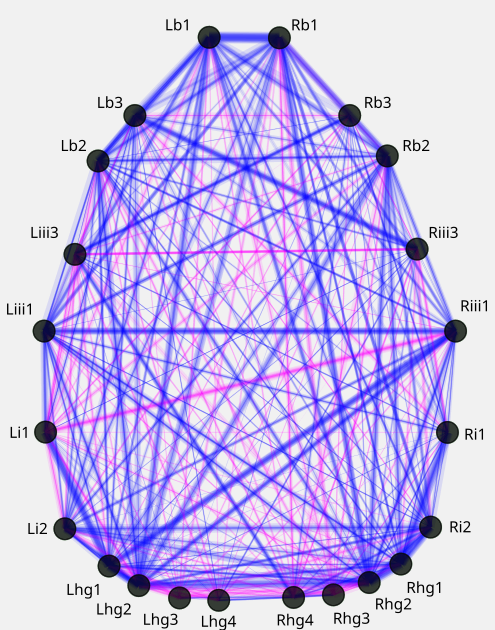

In [350]:
layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(filtered_df.loc[filtered_df['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.5/100000000000. for e in edges]
    nx.draw(G,
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph.svg')
plt.close('all')
display(SVG('graph.svg'))


['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


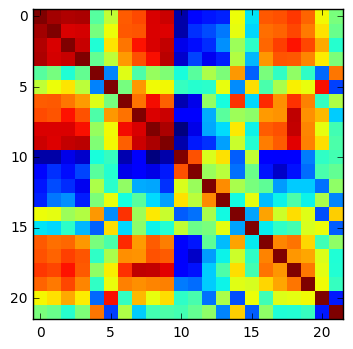

In [351]:
ax=plt.imshow(cor_mtrx, interpolation='none')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)
plt.show()

In [354]:
filtered_df= multi_fly_df.loc[multi_fly_df['stimulus']=='ol_blocks, g_x=-12, g_y=0 b_x=0, b_y=0']

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in divide


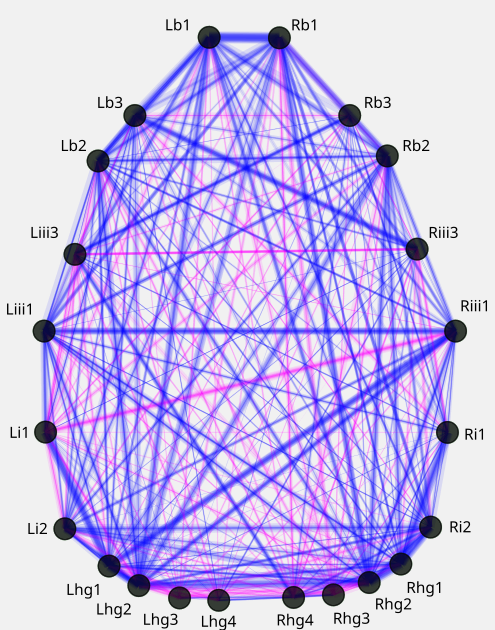

In [359]:
layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(filtered_df.loc[filtered_df['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.55/100000000000. for e in edges]
    nx.draw(G,
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_2.svg')
plt.close('all')
display(SVG('graph.svg'))

### convert to pngs for vid

['b1_right', 'b1_left', 'b2_right', 'b2_left', 'b3_right', 'b3_left', 'hg1_right', 'hg1_left', 'hg2_right', 'hg2_left', 'hg3_right', 'hg3_left', 'hg4_right', 'hg4_left', 'i1_right', 'i1_left', 'i2_right', 'i2_left', 'iii1_right', 'iii1_left', 'iii3_right', 'iii3_left']


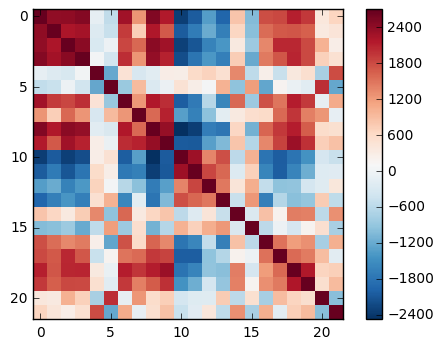

In [357]:
from matplotlib import cm
#from colorspacious import cspace_converter
from collections import OrderedDict
import matplotlib.colors as colors
from matplotlib.mlab import bivariate_normal


#cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
#cmaps['Diverging'] = ['PiBu']

ax=plt.imshow(cor_mtrx, cmap='RdBu_r', interpolation='none')

#plt.cmap('Diverging')
sorted_keys
#ax.set_xticklabels(sorted_keys)
print(sorted_keys)


plt.colorbar()

plt.show()

In [330]:
import matplotlib as plt
from matplotlib import cm
#from colorspacious import cspace_converter
from collections import OrderedDict
import matplotlib.colors as colors
from matplotlib.mlab import bivariate_normal



#cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
#cmaps['Diverging'] = ['PiBu']

ax=plt.imshow(cor_mtrx, cmap='bwr', interpolation='none')

#plt.cmap('Diverging')
sorted_keys
#ax.set_xticklabels(sorted_keys)
ax.set_xticklabels()
print(sorted_keys)

x = np.arange((len(sorted_keys)))
y = x.copy()
ticks_labels = [sorted_keys]

# Set number of ticks for x-axis
ax.set_xticks(x)
# Set ticks labels for x-axis
ax.set_xticklabels(ticks_labels, rotation='vertical', fontsize=18)
ax.set_yticklabels(ticks_labels, rotation='vertical', fontsize=18)


plt.colorbar()

plt.show()

AttributeError: 'module' object has no attribute 'imshow'

In [336]:
#### Color and zeroing 


import matplotlib as plt
from matplotlib import cm
#from colorspacious import cspace_converter
from collections import OrderedDict
import matplotlib.colors as colors
from matplotlib.mlab import bivariate_normal



#cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
#cmaps['Diverging'] = ['PiBu']

ax=plt.imshow(cor_mtrx, cmap='bwr', interpolation='none')

#plt.cmap('Diverging')
sorted_keys
#ax.set_xticklabels(sorted_keys)
ax.set_xticklabels()
print(sorted_keys)

x = np.arange((len(sorted_keys)))
y = x.copy()
ticks_labels = [sorted_keys]

# Set number of ticks for x-axis
ax.set_xticks(x)
# Set ticks labels for x-axis
ax.set_xticklabels(ticks_labels, rotation='vertical', fontsize=18)
ax.set_yticklabels(ticks_labels, rotation='vertical', fontsize=18)


plt.colorbar()

plt.show()


AttributeError: 'module' object has no attribute 'imshow'

In [49]:
sorted_keys_mod = sorted_keys
type(sorted_keys_mod)

list

In [47]:
kine_keys = sorted_keys_mod.append('left_amp')
kine_keys
#kinematic_sorted_keys = kine_keys.append('right_amp')

In [39]:
kinematic_sorted_keys = sorted_keys_mod
kinematic_sorted_keys

['b1_right',
 'b1_left',
 'b2_right',
 'b2_left',
 'b3_right',
 'b3_left',
 'hg1_right',
 'hg1_left',
 'hg2_right',
 'hg2_left',
 'hg3_right',
 'hg3_left',
 'hg4_right',
 'hg4_left',
 'i1_right',
 'i1_left',
 'i2_right',
 'i2_left',
 'iii1_right',
 'iii1_left',
 'iii3_right',
 'iii3_left',
 'left_amp',
 'left_amp',
 'right_amp']

In [ ]:
#layout = fifi.FigureLayout('graph_layout.svg',make_mplfigures=True)


cull_list = [('left', 'bkg'),('right', 'bkg'),
            ('left', 'iii24'),('right', 'iii24'),
            ('left', 'nm'),('right', 'nm'),
            ('left', 'pr'),('right', 'pr'),
            ('left', 'tpd'),('right', 'tpd')]

#[sorted_keys.remove(cull) for cull in cull_list]

for cull in cull_list:
    sorted_keys.remove(cull[1]+'_'+cull[0])

       
graphs = {}
for flynum in fly_nums:
    df=(filtered_df_yaw_left.loc[filtered_df_yaw_left['fly_num']==flynum])
    state_mtrx = np.vstack([df[key] for key in sorted_keys])
    centered_mtrx = state_mtrx - np.mean(state_mtrx,axis = 1)[:,None]
    std_mtrx = centered_mtrx/np.std(centered_mtrx,axis = 1)[:,None]
    cor_mtrx = np.dot(std_mtrx,std_mtrx.T)
    G = nx.Graph()
    for i,lbl1 in enumerate(sorted_keys):
        for j,lbl2 in enumerate(sorted_keys):
            G.add_edge(lbl1,lbl2,weight = cor_mtrx[i,j])
    graphs[int(flynum)] = G

edges = G.edges
c_ex = layout.pathspecs['excitatory'].mplkwargs()['edgecolor']
c_in = layout.pathspecs['inhibitory'].mplkwargs()['edgecolor']
colors = [{True:c_ex,False:c_in}[G[e[0]][e[1]]['weight']>0.] for e in edges]


h = float(layout.layout_uh)
pos_dict = {}
for n in G.nodes:
    #n_s = '%s_%s'%(n[0][0].capitalize(),n[1])
    n1, n2 = n.split('_')
    n_s = '%s_%s'%(n2[0].capitalize(), n1)
    cx = float(layout.pathspecs[n_s]['cx'])
    cy = h-float(layout.pathspecs[n_s]['cy'])
    try:
        if 'transform' in layout.pathspecs[n_s].keys():
            t1 = fifi.svg_to_axes.parse_transform(layout.pathspecs[n_s]['transform'])
            p = np.dot(t1,np.array([cx,cy,1]))
            pos_dict[n] = (p[0],p[1])
        else:
            pos_dict[n]  = (cx,cy)
    except KeyError:
        print n

for flynum,G in graphs.items():
    edges= G.edges
    #weights = [np.abs(G[e[0]][e[1]]['weight'])**2.6/100000000000. for e in edges]
    weights = [np.abs(G[e[0]][e[1]]['weight'])**3.4/100000000000. for e in edges]  #3.5
    nx.draw(G, 
            ax = layout.axes['network_graph_layout'],
            pos = pos_dict,
            font_color = 'r',
            with_labels= False,
            width = weights,
            edge_color = colors,
            node_color = 'k',
            alpha = 0.1)

    
    
layout.axes['network_graph_layout'].set_ybound(0,layout.axes['network_graph_layout'].h)
layout.axes['network_graph_layout'].set_xbound(0,layout.axes['network_graph_layout'].w)

layout.save('graph_yaw_right.svg')
plt.close('all')
display(SVG('graph_yaw_right.svg'))